In [1]:
# General System Imports
import datetime
import os
import sys
import warnings
warnings.filterwarnings('ignore')

# Scientific libraries
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
from scipy.stats import fisher_exact
from statsmodels.stats.multitest import multipletests

# Local code.
sys.path.append(os.path.join(os.getcwd(), "..", "code"))
from peck_data import load_pecking_days, windows_by_reward


# The standard color table of Etho Call-types
callColor = {
        'Be':(0/255.0, 230/255.0, 255/255.0),
        'BE':(0/255.0, 230/255.0, 255/255.0),
        'Tu':(255/255.0, 200/255.0, 65/255.0),
        'TU':(255/255.0, 200/255.0, 65/255.0),
        'Th':(255/255.0, 150/255.0, 40/255.0),
        'TH':(255/255.0, 150/255.0, 40/255.0),
        'Alarm':(255/255.0, 200/255.0, 65/255.0),
        'Di':(255/255.0, 105/255.0, 15/255.0),
        'DI':(255/255.0, 105/255.0, 15/255.0),
        'Ag':(255/255.0, 0/255.0, 0/255.0),
        'AG':(255/255.0, 0/255.0, 0/255.0),
        'Fight':(255/255.0, 105/255.0, 15/255.0),
        'Wh':(255/255.0, 180/255.0, 255/255.0),
        'WH':(255/255.0, 180/255.0, 255/255.0),
        'Ne':(255/255.0, 100/255.0, 255/255.0),
        'NE':(255/255.0, 100/255.0, 255/255.0),
        'Te':(140/255.0, 100/255.0, 185/255.0),
        'TE':(140/255.0, 100/255.0, 185/255.0),
        'Soft':(255/255.0, 180/255.0, 255/255.0),
        'DC':(100/255.0, 50/255.0, 200/255.0),
        'LT':(0/255.0, 95/255.0, 255/255.0),
        'Loud':(100/255.0, 50/255.0, 200/255.0),
        'song':(0, 0, 0),
        'So':(0,0,0), 
        'SO':(0,0,0),
        'In': (0.49,0.60,0.55), 
        'Mo':(0.69,0.39,0.39),
        'Ri':(0,255/255.0,0),
        'WC': (.25, .25, .25)}

In [2]:
# The diretory for saving figures - Change to place of your choice
figDir = os.path.expanduser('~/Desktop/')

# The behavioral data is stored in csv files in the data directory
DATADIR = "../data/behavior/"
RESULTSDIR = "../results/"

In [3]:
def compute_odds_ratio(group, versus, *args): # Reward DC, All Unrewarded -> Unreward So, Reward DC
    dums = [
        [len(group[group["Response"] == True]),
        len(group[group["Response"] == False])],
        [len(versus[versus["Response"] == True]),
        len(versus[versus["Response"] == False])]
    ]
#     if dums[1][0] == 0 and args[0] == "less":
#         dums[1][0] += 1
#     if dums[0][0] == 0 and args[0] == "greater":
#         dums[0][0] += 1
    _, pvalue = fisher_exact(dums, *args)

    for i in range(2):
        for j in range(2):
            if dums[i][j] == 0:
                dums[i][j] += 1

    return fisher_exact(dums, *args)[0], pvalue
 

def set_oddsratio_yticks(ax, biggest, ylabels=True):
    ax.set_ylim(np.power(2., -biggest), np.power(2., biggest))
    ax.set_yscale("log")
    
    powers = np.arange(0, biggest + 1)
    n = len(powers)
    powers = powers[::n // 6 + 1]
    vals = np.concatenate([-powers, powers[1:]])

    ticks = np.power(2., vals)
    labels = [r"x{:d}".format(int(2 ** v)) if v >= 0 else r"x1/{:d}".format(int(2 ** -v)) for v in vals]
    
    if ylabels:
        ax.set_ylabel("Odds Ratio", fontsize=10)
    # ax.set_xlabel("Trial", fontsize=12)
    ax.set_yticks(ticks)
    ax.set_yticklabels(labels, fontsize=8)
    ax.tick_params(axis='x', labelsize=8)
    ax.hlines(1, *plt.xlim(), linestyle="--", zorder=-1)


In [4]:
def cached_load(bird, date, date_end=None, call_type = None, minRT = 0):
    if (bird, date, date_end, minRT) not in cached_load._cache:
        print('Needs to load data')
        if date_end is not None:
            blocks, stim_blocks = load_pecking_days(os.path.join(DATADIR, bird), date_range=(date, date_end), call_type = call_type, minRT = minRT)
            cached_load._cache[(bird, date, date_end, minRT)] = (blocks, stim_blocks)
            print(blocks)
        else:
            blocks, stim_blocks = load_pecking_days(os.path.join(DATADIR, bird, date.strftime("%d%m%y")), call_type = call_type, minRT = minRT)
            cached_load._cache[(bird, date, date_end, minRT)] = (blocks, stim_blocks)
            print(blocks)

    return cached_load._cache[(bird, date, date_end, minRT)]

cached_load._cache = {}



In [5]:
# manually found all start and end dates for all birds on all calls
bird_dates = {
    "HpiHpi1625F" : {
        "Te": {"start": datetime.date(2017, 4, 5), "end": datetime.date(2017, 4, 7)},
        "Tu": {"start": datetime.date(2017, 4, 8), "end": datetime.date(2017, 4, 9)},
        "Di": {"start": datetime.date(2017, 4, 10), "end": datetime.date(2017, 4, 12)},
        "Th": {"start": datetime.date(2017, 4, 13), "end": datetime.date(2017, 4, 16)},
        "Ag": {"start": datetime.date(2017, 4, 17), "end": datetime.date(2017, 4, 18)},
        "Wh": {"start": datetime.date(2017, 4, 19), "end": datetime.date(2017, 4, 20)},
        "So": {"start": datetime.date(2017, 4, 21), "end": datetime.date(2017, 4, 21)},
        "Be": {"start": datetime.date(2017, 4, 22), "end": datetime.date(2017, 4, 22)},
        "DC": {"start": datetime.date(2017, 4, 23), "end": datetime.date(2017, 4, 24)},
        "Ne": {"start": datetime.date(2017, 4, 25), "end": datetime.date(2017, 4, 26)},
        "LT": {"start": datetime.date(2017, 4, 27), "end": datetime.date(2017, 4, 28)},
    },
    # This bird injured her leg during LT tests on 20/26
   # "LblGra2025F" : {
   #    "Te": {"start": datetime.date(2016, 10, 16), "end": datetime.date(2016, 10, 19)},
   #    "Tu": {"start": datetime.date(2016, 10, 29), "end": datetime.date(2016, 10, 31)},
   #    "Di": {"start": datetime.date(2016, 11, 2), "end": datetime.date(2016, 11, 6)},
   #    "Th": {"start": datetime.date(2016, 10, 20), "end": datetime.date(2016, 10, 22)},
   #    "Ag": {"start": datetime.date(2016, 11, 1), "end": datetime.date(2016, 11, 1)},
   #    "Wh": {"start": datetime.date(2016, 10, 12), "end": datetime.date(2016, 10, 13)},
   #    "So": {"start": datetime.date(2016, 10, 14), "end": datetime.date(2016, 10, 15)},
   #    "Be": {"start": datetime.date(2016, 10, 23), "end": datetime.date(2016, 10, 24)},
   #    "DC": {"start": datetime.date(2016, 10, 10), "end": datetime.date(2016, 10, 11)},
   #    "Ne": {"start": datetime.date(2016, 11, 7), "end": datetime.date(2016, 11, 12)},
   #    "LT": {"start": datetime.date(2016, 10, 25), "end": datetime.date(2016, 10, 28)},
   # },
    "HpiHpi1918M" : {
        "Te": {"start": datetime.date(2017, 2, 28), "end": datetime.date(2017, 3, 1)},
        "Tu": {"start": datetime.date(2017, 2, 26), "end": datetime.date(2017, 2, 27)},
        "Di": {"start": datetime.date(2017, 2, 14), "end": datetime.date(2017, 2, 15)},
        "Th": {"start": datetime.date(2017, 2, 12), "end": datetime.date(2017, 2, 13)},
        "Ag": {"start": datetime.date(2017, 2, 23), "end": datetime.date(2017, 2, 23)},
        "Wh": {"start": datetime.date(2017, 2, 20), "end": datetime.date(2017, 2, 21)},
        "So": {"start": datetime.date(2017, 2, 25), "end": datetime.date(2017, 2, 25)},
        "Be": {"start": datetime.date(2017, 2, 16), "end": datetime.date(2017, 2, 16)},
        "DC": {"start": datetime.date(2017, 2, 19), "end": datetime.date(2017, 2, 19)},
        "Ne": {"start": datetime.date(2017, 2, 24), "end": datetime.date(2017, 2, 24)},
        "LT": {"start": datetime.date(2017, 2, 22), "end": datetime.date(2017, 2, 22)},
    },
    "HpiGra1242F" : {
        "Te": {"start": datetime.date(2016, 12, 4), "end": datetime.date(2016, 12, 6)},
        "Tu": {"start": datetime.date(2016, 11, 30), "end": datetime.date(2016, 11, 30)},
        "Di": {"start": datetime.date(2016, 12, 17), "end": datetime.date(2016, 12, 17)},
        "Th": {"start": datetime.date(2016, 12, 7), "end": datetime.date(2016, 12, 9)},
        "Ag": {"start": datetime.date(2016, 12, 10), "end": datetime.date(2016, 12, 10)},
        "Wh": {"start": datetime.date(2016, 12, 2), "end": datetime.date(2016, 12, 3)},
        "So": {"start": datetime.date(2016, 11, 11), "end": datetime.date(2016, 11, 12)},
        "Be": {"start": datetime.date(2016, 11, 13), "end": datetime.date(2016, 11, 14)},
        "DC": {"start":datetime.date(2016, 12, 1), "end": datetime.date(2016, 12, 1)},
        "Ne": {"start": datetime.date(2016, 12, 13), "end": datetime.date(2016, 12, 16)},
        "LT": {"start": datetime.date(2016, 12, 11), "end": datetime.date(2016, 12, 12)},
    },
    "GreLbl3131M" : {
       "Te": {"start": datetime.date(2016, 12, 18), "end": datetime.date(2016, 12, 21)},
       "Tu": {"start": datetime.date(2016, 12, 24), "end": datetime.date(2016, 12, 25)},
       "Di": {"start": datetime.date(2016, 12, 17), "end": datetime.date(2016, 12, 17)},
       "Th": {"start": datetime.date(2017, 1, 19), "end": datetime.date(2017, 1, 23)},
       "Ag": {"start": datetime.date(2017, 1, 3), "end": datetime.date(2017, 1, 6)},
       "Wh": {"start": datetime.date(2016, 12, 14), "end": datetime.date(2016, 12, 15)},
       "So": {"start": (datetime.date(2016, 12, 12), datetime.date(2016, 12, 16)) , 
              "end": (datetime.date(2016, 12, 12), datetime.date(2016, 12, 16)) },
       "Be": {"start": datetime.date(2016, 12, 13), "end": datetime.date(2016, 12, 13)},
       "DC": {"start": datetime.date(2017, 1, 24), "end": datetime.date(2017, 1, 27)},
       "Ne": {"start": datetime.date(2016, 12, 22), "end": datetime.date(2016, 12, 23)},
       "LT": {"start": datetime.date(2017, 1, 7), "end": datetime.date(2017, 1, 10)},
    },
    "GreLbl1635F" : {
        "Te": {"start": datetime.date(2017, 5, 24), "end": datetime.date(2017, 5, 24)},
        "Tu": {"start": datetime.date(2017, 5, 14), "end": datetime.date(2017, 5, 15)},
        "Di": {"start": datetime.date(2017, 5, 16), "end": datetime.date(2017, 5, 17)},
        "Th": {"start": datetime.date(2017, 5, 21), "end": datetime.date(2017, 5, 21)},
        "Ag": {"start": datetime.date(2017, 5, 18), "end": datetime.date(2017, 5, 18)},
        "Wh": {"start": datetime.date(2017, 5, 12), "end": datetime.date(2017, 5, 13)},
        "So": {"start": datetime.date(2017, 5, 20), "end": datetime.date(2017, 5, 20)},
        "Be": {"start": datetime.date(2017, 5, 19), "end": datetime.date(2017, 5, 19)},
        "DC": {"start": datetime.date(2017, 5, 10), "end": datetime.date(2017, 5, 11)},
        "Ne": {"start": datetime.date(2017, 5, 8),  "end": datetime.date(2017, 5, 9)},
        "LT": {"start": datetime.date(2017, 5, 22), "end": datetime.date(2017, 5, 23)},
    },
    "GraLbl4833M" : {
        "Te": {"start": datetime.date(2017, 4, 9), "end": datetime.date(2017, 4, 9)},
        "Tu": {"start": datetime.date(2017, 4, 12), "end": datetime.date(2017, 4, 13)},
        "Di": {"start": datetime.date(2017, 4, 17), "end": datetime.date(2017, 4, 18)},
        "Th": {"start": datetime.date(2017, 4, 6), "end": datetime.date(2017, 4, 6)},
        "Ag": {"start": datetime.date(2017, 4, 14), "end": datetime.date(2017, 4, 16)},
        "Wh": {"start": datetime.date(2017, 4, 19), "end": datetime.date(2017, 4, 20)},
        "So": {"start": datetime.date(2017, 4, 8), "end": datetime.date(2017, 4, 8)},
        "Be": {"start": datetime.date(2017, 4, 10), "end": datetime.date(2017, 4, 11)},
        "DC": {"start": datetime.date(2017, 4, 5), "end": datetime.date(2017, 4, 5)},
        "Ne": {"start": datetime.date(2017, 4, 21), "end": datetime.date(2017, 4, 21)},
        "LT": {"start": datetime.date(2017, 4, 7), "end": datetime.date(2017, 4, 7)},
    },
    "GraLbl1718F" : {
        "Te": {"start": datetime.date(2017, 4, 9), "end": datetime.date(2017, 4, 9)},
        "Tu": {"start": datetime.date(2017, 4, 4), "end": datetime.date(2017, 4, 5)},
        "Di": {"start": datetime.date(2017, 4, 12), "end": datetime.date(2017, 4, 12)},
        "Th": {"start": datetime.date(2017, 4, 6), "end": datetime.date(2017, 4, 6)},
        "Ag": {"start": datetime.date(2017, 4, 10), "end": datetime.date(2017, 4, 11)},
        "Wh": {"start": datetime.date(2017, 4, 8), "end": datetime.date(2017, 4, 8)},
        "So": {"start": datetime.date(2017, 3, 30), "end": datetime.date(2017, 3, 30)},
        "Be": {"start": datetime.date(2017, 3, 29), "end": datetime.date(2017, 3, 29)},
        "DC": {"start": datetime.date(2017, 4, 7), "end": datetime.date(2017, 4, 7)},
        "Ne": {"start": datetime.date(2017, 3, 31), "end": datetime.date(2017, 3, 31)},
        "LT": {"start": datetime.date(2017, 4, 1), "end": datetime.date(2017, 4, 3)},
    },
    # Removing because of no Ne Call
    "GraGre0917M" : { 
        "Te": {"start": datetime.date(2017, 3, 28), "end": datetime.date(2017, 3, 28)},
        "Tu": {"start": datetime.date(2017, 3, 27), "end": datetime.date(2017, 3, 27)},
        "Di": {"start": datetime.date(2017, 4, 1), "end": datetime.date(2017, 4, 1)},
        "Th": {"start": datetime.date(2017, 4, 3), "end": datetime.date(2017, 4, 4)},
        "Ag": {"start": datetime.date(2017, 3, 31), "end": datetime.date(2017, 3, 31)},
        "Wh": {"start": datetime.date(2017, 4, 8), "end": datetime.date(2017, 4, 8)},
        "So": {"start": datetime.date(2017, 4, 6), "end": datetime.date(2017, 4, 6)},
        "Be": {"start": datetime.date(2017, 3, 29), "end": datetime.date(2017, 3, 29)},
        "DC": {"start": datetime.date(2017, 3, 30), "end": datetime.date(2017, 3, 30)},
        # "Ne": {"start": datetime.date(2017, 3, 31), "end": datetime.date(2017, 3, 31)},
         "LT": {"start": datetime.date(2017, 4, 7), "end": datetime.date(2017, 4, 7)},
    },
    "GraGra1918F" : {
        "Te": {"start": datetime.date(2017, 2, 10), "end": datetime.date(2017, 2, 10)},
        "Tu": {"start": datetime.date(2017, 2, 7), "end": datetime.date(2017, 2, 8)},
        "Di": {"start": datetime.date(2017, 2, 3), "end": datetime.date(2017, 2, 4)},
        "Th": {"start": datetime.date(2017, 2, 9), "end": datetime.date(2017, 2, 9)},
        "Ag": {"start": datetime.date(2017, 2, 6), "end": datetime.date(2017, 2, 6)},
        "Wh": {"start": datetime.date(2017, 1, 31), "end": datetime.date(2017, 2, 1)},
        "So": {"start": datetime.date(2017, 1, 30), "end": datetime.date(2017, 1, 30)},
        "Be": {"start": datetime.date(2017, 2, 12), "end": datetime.date(2017, 2, 13)},
        "DC": {"start": datetime.date(2017, 2, 11), "end": datetime.date(2017, 2, 11)},
        "Ne": {"start": datetime.date(2017, 2, 2), "end": datetime.date(2017, 2, 2)},
        "LT": {"start": datetime.date(2017, 2, 14), "end": datetime.date(2017, 2, 14)},
    },
    "LblWhi1566M" : {
        "Te": {"start": datetime.date(2017, 5, 17), "end": datetime.date(2017, 5, 19)},
        "Tu": {"start": datetime.date(2017, 5, 14), "end": datetime.date(2017, 5, 14)},
        "Di": {"start": datetime.date(2017, 5, 15), "end": datetime.date(2017, 5, 16)},
        "Th": {"start": datetime.date(2017, 5, 12), "end": datetime.date(2017, 5, 13)},
        "Ag": {"start": datetime.date(2017, 5, 3), "end": datetime.date(2017, 5, 4)},
        "Wh": {"start": datetime.date(2017, 5, 9), "end": datetime.date(2017, 5, 11)},
        "So": {"start": datetime.date(2017, 5, 5), "end": datetime.date(2017, 5, 5)},
        "Be": {"start": datetime.date(2017, 5, 6), "end": datetime.date(2017, 5, 6)},
        "DC": {"start": datetime.date(2017, 4, 30), "end": datetime.date(2017, 5, 2)},
        "Ne": {"start": datetime.date(2017, 5, 20), "end": datetime.date(2017, 5, 20)},
        "LT": {"start": datetime.date(2017, 5, 7), "end": datetime.date(2017, 5, 8)},
    },
    "LblGra3039M" : {
        "Te": {"start": datetime.date(2017, 2, 21), "end": datetime.date(2017, 2, 24)}, # also 3/20-3/22 but ignore them
        "Tu": {"start": (datetime.date(2017, 3, 17), datetime.date(2017, 3, 23)), 
               "end": (datetime.date(2017, 3, 19), datetime.date(2017, 3, 23)) }, # = 17, 18, 19 and 23!
        "Di": {"start": datetime.date(2017, 3, 4), "end": datetime.date(2017, 3, 5)},
        "Th": {"start": datetime.date(2017, 3, 8), "end": datetime.date(2017, 3, 10)},
        "Ag": {"start": datetime.date(2017, 2, 26), "end": datetime.date(2017, 2, 27)},
        "Wh": {"start": datetime.date(2017, 3, 11), "end": datetime.date(2017, 3, 13)},
        "So": {"start": datetime.date(2017, 2, 25), "end": datetime.date(2017, 2, 25)},
        "Be": {"start": datetime.date(2017, 3, 14), "end": datetime.date(2017, 3, 16)},
        "DC": {"start": datetime.date(2017, 3, 6), "end": datetime.date(2017, 3, 7)},
        "Ne": {"start": datetime.date(2017, 2, 28), "end": datetime.date(2017, 3, 1)},
        "LT": {"start": datetime.date(2017, 3, 2), "end": datetime.date(2017, 3, 3)},
    },
    "LblGra2826F" : {
        "Te": {"start": datetime.date(2016, 10, 30), "end": datetime.date(2016, 11, 1)},
        "Tu": {"start": datetime.date(2016, 11, 4), "end": datetime.date(2016, 11, 6)},
        "Di": {"start": datetime.date(2016, 11, 7), "end": datetime.date(2016, 11, 10)},
        "Th": {"start": datetime.date(2016, 11, 16), "end": datetime.date(2016, 11, 17)},
        "Ag": {"start": datetime.date(2016, 10, 24), "end": datetime.date(2016, 10, 25)},
        "Wh": {"start": datetime.date(2016, 10, 29), "end": datetime.date(2016, 10, 29)},
        "So": {"start": datetime.date(2016, 11, 14), "end": datetime.date(2016, 11, 15)},
        "Be": {"start": datetime.date(2016, 11, 2), "end": datetime.date(2016, 11, 3)},
        "DC": {"start": datetime.date(2016, 11, 11), "end": datetime.date(2016, 11, 13)},
        "Ne": {"start": datetime.date(2016, 10, 26), "end": datetime.date(2016, 10, 28)},
        "LT": {"start": datetime.date(2016, 10, 21), "end": datetime.date(2016, 10, 23)},
    }
}


In [6]:

nbirds = len(bird_dates)
print('Processing %d birds' % nbirds)

nmales = 0
nfemales = 0
testedCalDays = []
testedDays = []
for bird in bird_dates.keys():
    
    if bird[-1] == 'M':
        nmales +=1
    elif bird[-1] == 'F':
        nfemales +=1
    startDate = datetime.date(2020, 1, 1)
    endDate = datetime.date(2010, 1, 1)
    testedBirdDays = datetime.timedelta(0)
    for callType in bird_dates[bird].keys():
        start_date = bird_dates[bird][callType]["start"]
        end_date = bird_dates[bird][callType]["end"]
        if type(start_date) is tuple :
            for date in start_date:
                if ( date < startDate ):
                    startDate = date         
        else:
            if ( start_date < startDate):
                startDate = start_date 
        if type(end_date) is tuple :
            for date in end_date:
                if ( date > endDate ):
                    endDate = date         
        else:
            if ( end_date > endDate):
                endDate = end_date 
 
        if type(start_date) is tuple:
            for sdate, edate in zip(start_date, end_date):
                testedBirdDays = testedBirdDays + (edate - sdate) + datetime.timedelta(days=1)
        else:
            testedBirdDays = testedBirdDays + (end_date - start_date) + datetime.timedelta(days=1)
    print(bird, " Tested Calendar days: ", endDate - startDate, " Testing Days: ", testedBirdDays)

    testedCalDays.append(endDate - startDate) 
    testedDays.append(testedBirdDays)       

print('\t %d males and %d females' % (nmales, nfemales))

Processing 12 birds
HpiHpi1625F  Tested Calendar days:  23 days, 0:00:00  Testing Days:  24 days, 0:00:00
HpiHpi1918M  Tested Calendar days:  17 days, 0:00:00  Testing Days:  16 days, 0:00:00
HpiGra1242F  Tested Calendar days:  36 days, 0:00:00  Testing Days:  22 days, 0:00:00
GreLbl3131M  Tested Calendar days:  46 days, 0:00:00  Testing Days:  31 days, 0:00:00
GreLbl1635F  Tested Calendar days:  16 days, 0:00:00  Testing Days:  17 days, 0:00:00
GraLbl4833M  Tested Calendar days:  16 days, 0:00:00  Testing Days:  17 days, 0:00:00
GraLbl1718F  Tested Calendar days:  14 days, 0:00:00  Testing Days:  15 days, 0:00:00
GraGre0917M  Tested Calendar days:  12 days, 0:00:00  Testing Days:  11 days, 0:00:00
GraGra1918F  Tested Calendar days:  15 days, 0:00:00  Testing Days:  15 days, 0:00:00
LblWhi1566M  Tested Calendar days:  20 days, 0:00:00  Testing Days:  21 days, 0:00:00
LblGra3039M  Tested Calendar days:  30 days, 0:00:00  Testing Days:  28 days, 0:00:00
LblGra2826F  Tested Calendar days:

In [7]:
# Load the data
# We set a min RT at 500 ms because there are double pecks at trial initiation.
# See BEHAV-RT for the response time analysis
minRT = 500

countHist = np.zeros(6, dtype = 'int64')
for bird in bird_dates:  
    for cty in bird_dates[bird]:
        # blocks, stim_blocks = load_pecking_days(os.path.join(DATADIR, bird), date_range=(bird_dates[bird][cty]['start'], bird_dates[bird][cty]['end']), call_type = cty)
        blocks, stim_blocks = cached_load(bird, bird_dates[bird][cty]['start'], date_end=bird_dates[bird][cty]['end'],  call_type = cty, minRT = minRT)
        bird_dates[bird][cty]['n_trials'] = 0
        for block in blocks:
            bird_dates[bird][cty]['n_trials'] += len(block.data)
        n_re_stim = 0
        n_unre_stim = 0
        n_re_trial = 0
        n_unre_trial = 0
        countHistDay = np.zeros(6, dtype = 'int64')
        for stim in stim_blocks:
            n_re_trial += np.sum(stim.loc[stim['Class'] == 'Rewarded']['Trials'])
            n_re_stim += len(stim.loc[stim['Class'] == 'Rewarded']['Trials'])
            n_unre_trial += np.sum(stim.loc[stim['Class'] == 'Unrewarded']['Trials'])
            n_unre_stim += len(stim.loc[stim['Class'] == 'Unrewarded']['Trials'])
            counts, bins  = np.histogram(stim['Trials'], bins = 6, range=(-0.5,5.5))
            countHistDay += counts

        totcounts = np.sum(countHistDay)
        if (totcounts < 1320):
            countHistDay[0] = 1320-totcounts
        countHist += countHistDay

        bird_dates[bird][cty]['n_re_trials'] = n_re_trial
        bird_dates[bird][cty]['n_unre_trials'] = n_unre_trial
        bird_dates[bird][cty]['n_re_stim'] = n_re_stim
        bird_dates[bird][cty]['n_unre_stim'] = n_unre_stim
    

Needs to load data
Loading 2017-04-05 ../data/behavior/HpiHpi1625F
Needs to load data
Loading 2017-04-08 ../data/behavior/HpiHpi1625F
Needs to load data
Loading 2017-04-10 ../data/behavior/HpiHpi1625F
Needs to load data
Loading 2017-04-13 ../data/behavior/HpiHpi1625F
Needs to load data
Loading 2017-04-17 ../data/behavior/HpiHpi1625F
Needs to load data
Loading 2017-04-19 ../data/behavior/HpiHpi1625F
Needs to load data
Loading 2017-04-21 ../data/behavior/HpiHpi1625F
Needs to load data
Loading 2017-04-22 ../data/behavior/HpiHpi1625F
Needs to load data
Loading 2017-04-23 ../data/behavior/HpiHpi1625F
Needs to load data
Loading 2017-04-25 ../data/behavior/HpiHpi1625F
Needs to load data
Loading 2017-04-27 ../data/behavior/HpiHpi1625F
Needs to load data
Loading 2017-02-28 ../data/behavior/HpiHpi1918M
Needs to load data
Loading 2017-02-26 ../data/behavior/HpiHpi1918M
Needs to load data
Loading 2017-02-14 ../data/behavior/HpiHpi1918M
Needs to load data
Loading 2017-02-12 ../data/behavior/HpiHpi1

In [8]:
totalTrials = 0
allBirdsTrials = []
totalReStims = 0
totalUnReStims = 0
totalReTrials = 0
totalUnReTrials = 0
for bird in bird_dates:
    print(bird, ':')
    birdTrials = 0
    for cty in bird_dates[bird]:
        print('\t %s %d (Re %d UnRe %d Sum %d) trials' % (cty, bird_dates[bird][cty]['n_trials'], bird_dates[bird][cty]['n_re_trials'], bird_dates[bird][cty]['n_unre_trials'], bird_dates[bird][cty]['n_re_trials'] + bird_dates[bird][cty]['n_unre_trials'] ))
        print('\t \t Re Stims %d UnRe Stims %d' % (bird_dates[bird][cty]['n_re_stim'], bird_dates[bird][cty]['n_unre_stim'] ))
        totalTrials += bird_dates[bird][cty]['n_trials']
        birdTrials += bird_dates[bird][cty]['n_trials']
        totalReStims += bird_dates[bird][cty]['n_re_stim']
        totalUnReStims += bird_dates[bird][cty]['n_unre_stim']
        totalReTrials +=  bird_dates[bird][cty]['n_re_trials']
        totalUnReTrials +=  bird_dates[bird][cty]['n_unre_trials']

    print('\t Sum %d trials' % (birdTrials ))
    allBirdsTrials.append(birdTrials)

print('Total number of trials:', totalTrials, 'Re:', totalReTrials, 'UnRe:', totalUnReTrials, 'Check:', totalReTrials+totalUnReTrials)
print('Total number of Re Stims:', totalReStims, 'UnRe:', totalUnReStims)
print('Total number of Trials/Stims Re:', totalReTrials/totalReStims, 'UnRe:', totalUnReTrials/totalUnReStims)
print('Total number of trials per stim:', totalTrials/(totalReStims+totalUnReStims))

print(allBirdsTrials)
print('Mean Number of Trials %.0f [%d, %d]' % (np.mean(allBirdsTrials), np.min(allBirdsTrials), np.max(allBirdsTrials)))

HpiHpi1625F :
	 Te 1158 (Re 214 UnRe 944 Sum 1158) trials
	 	 Re Stims 12 UnRe Stims 120
	 Tu 613 (Re 125 UnRe 488 Sum 613) trials
	 	 Re Stims 12 UnRe Stims 120
	 Di 264 (Re 63 UnRe 201 Sum 264) trials
	 	 Re Stims 12 UnRe Stims 99
	 Th 480 (Re 82 UnRe 398 Sum 480) trials
	 	 Re Stims 12 UnRe Stims 117
	 Ag 754 (Re 161 UnRe 593 Sum 754) trials
	 	 Re Stims 12 UnRe Stims 119
	 Wh 698 (Re 147 UnRe 551 Sum 698) trials
	 	 Re Stims 12 UnRe Stims 120
	 So 591 (Re 121 UnRe 470 Sum 591) trials
	 	 Re Stims 12 UnRe Stims 119
	 Be 620 (Re 126 UnRe 494 Sum 620) trials
	 	 Re Stims 12 UnRe Stims 119
	 DC 1249 (Re 258 UnRe 991 Sum 1249) trials
	 	 Re Stims 12 UnRe Stims 120
	 Ne 1302 (Re 261 UnRe 1041 Sum 1302) trials
	 	 Re Stims 12 UnRe Stims 120
	 LT 877 (Re 184 UnRe 693 Sum 877) trials
	 	 Re Stims 12 UnRe Stims 120
	 Sum 8606 trials
HpiHpi1918M :
	 Te 715 (Re 149 UnRe 566 Sum 715) trials
	 	 Re Stims 12 UnRe Stims 119
	 Tu 951 (Re 188 UnRe 763 Sum 951) trials
	 	 Re Stims 12 UnRe Stims 120
	

In [9]:
np.sum(allBirdsTrials)

132938

In [10]:
# modified from pecking_analysis
def get_oddsratio(date, date_end, bird, mode, show_stims_re, show_stims_un, window_size, sig_threshold=0.05,plt_title=None, ax=None, call_type =None, ylabelOn = True, minRT=0):
    if date is None:
        return
    
    show_stims = show_stims_re + show_stims_un


    blocks, stim_blocks = cached_load(bird, date, date_end, call_type = call_type, minRT=minRT)
    
    # THE MAIN STUFF
    for block, stims in zip(blocks, stim_blocks):
        
       # if block.date == date:
            block.data.index = pd.Series(np.arange(len(block.data)))

            if mode == "windowedoddsratios":

                if ax == None:
                    fig = plt.figure(figsize=(2, 1.5), dpi=80)
                    ax = matplotlib.axes.Axes(fig)
                    
                if plt_title:
                    ax.set_title(plt_title)
                    
                grouped = block.data.groupby(["Class", "Call Type"])#, "Bird Name"])
                results = []

                biggest = 0
                for (rewarded, call_type), group in sorted(grouped.groups.items(),
                                                                      key=lambda x: (x[0][0], x[0][1])):

                    if len(show_stims) and bird_name not in show_stims:
                        continue

                    group = block.data.loc[group] # FT I think this should be loc and not iloc
                    alts = block.data[block.data["Class"] != rewarded]

                    # result = compute_odds_ratio(group, alts, "less" if rewarded == "Rewarded" else "greater")
                    result = compute_odds_ratio(alts, group, "greater" if rewarded == "Rewarded" else "less")
                    results.append(["blue" if rewarded == "Rewarded" else "red", result])

                    # windowed, windowed_rest = windows_by_reward(group, alts, rewarded == "Rewarded", n=window_size)
                    windowed, windowed_rest = windows_by_reward(alts, group, rewarded == "Rewarded", n=window_size)

                    x = []
                    y = []
                    sigs = []
                    cum = 0
                    for window, rest in zip(windowed, windowed_rest):
                        x.append(np.mean(window["OverallTrial"]))
                        # x.append(cum+len(window)//2)
                        cum += len(window)
                        # odds, pvalue = compute_odds_ratio(window, rest, "less" if rewarded == "Rewarded" else "greater")
                        odds, pvalue = compute_odds_ratio(window, rest, "greater" if rewarded == "Rewarded" else "less")
                        y.append(odds)
                        sigs.append(pvalue < sig_threshold) # / len(windowed))

                    # color= "blue" if rewarded == "Rewarded" else "red"
                    color = callColor[call_type]
                    if len(x) > 1:
                        ax.plot(x, y, color=color, linewidth=1)
                    else:
                        ax.scatter(x, y, s=5, marker="x", color=color)

                    biggest = max(np.max(np.round(1 + np.abs(np.log2(np.array(y))))), biggest)
                
                    #for x_, y_, sig_ in zip(x, y, sigs):
                        #if sig_:                            
                            #ax.scatter([x_], [y_], marker="d", s=100, color="blue" if rewarded == "Rewarded" else "red")
                        
                    for ix in range(len(x)):
                        if sigs[ix]:
                            if ix > 0:
                                k = (np.log(y[ix])-np.log(y[ix-1]))/(x[ix]-x[ix-1])
                                dx = (x[ix]-x[ix-1])/2
                                ax.plot( [(x[ix-1]+x[ix])/2, x[ix]], [np.exp(np.log(y[ix-1])+ k*dx), y[ix]], color=color, linewidth=2)
                            if ix < len(x)-1:
                                k = (np.log(y[ix+1])-np.log(y[ix]))/(x[ix+1]-x[ix])
                                dx = (x[ix+1]-x[ix])/2
                                ax.plot( [x[ix], (x[ix+1]+x[ix])/2], [y[ix], np.exp(np.log(y[ix]) +k*dx)], color=color, linewidth=2)
                            #ax.scatter([x_], [y_], marker="d", s=100, color="blue" if rewarded == "Rewarded" else "red")

                        
                #plt.xlim(0, np.max(block.data["OverallTrial"]))
                set_oddsratio_yticks(ax, biggest, ylabels=ylabelOn)
                ax.minorticks_off()
                ax.hlines(1, xmin=ax.get_xlim()[0], xmax = ax.get_xlim()[1], linestyle="--", color = 'k', linewidth = 1)
                return ax

            elif mode == "oddsratios":
                grouped = block.data.groupby(["Class", "Call Type"])#, "Bird Name"])
                results = []
                labels = []

                bar_idx = 0
                labeled_already = {
                    "Rewarded": False,
                    "Unrewarded": False,
                }
                for (rewarded, call_type), group in sorted(grouped.groups.items(),
                                                                      key=lambda x: (x[0][0], x[0][1])):
                    group = block.data.iloc[group]
                    alts = block.data[block.data["Class"] != rewarded]

                    result = compute_odds_ratio(group, alts, "less" if rewarded == "Rewarded" else "greater")
                    results.append([rewarded, result])
                    labels.append("{}".format(call_type))

                df = pd.DataFrame(
                    data=list(zip(*[
                        labels,
                        [r[1][0] for r in results],
                        [r[1][1] for r in results]
                    ])),
                    columns=["Call", "Odds Ratio", "p-value"],
                )
                return df
            
            else:
                print('Unknown mode:', mode)
                return
            

----------------------------- HpiHpi1625F --------------------------------


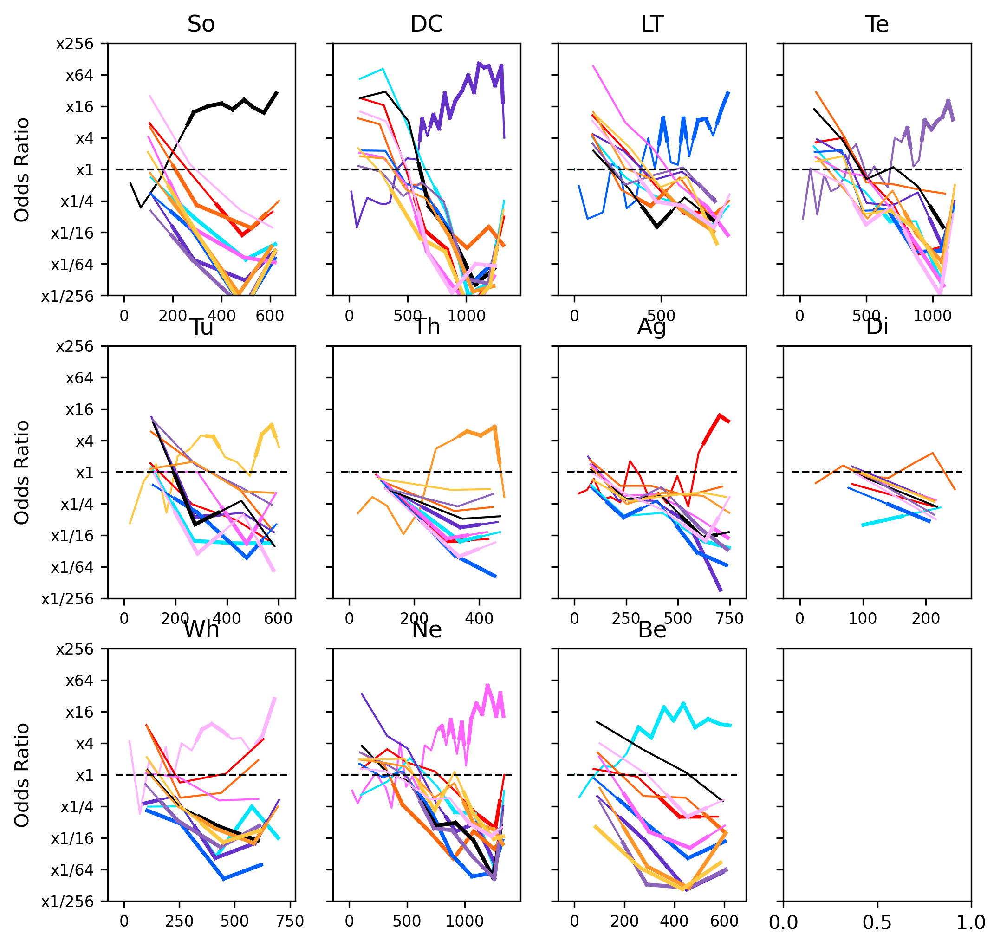

----------------------------- HpiHpi1918M --------------------------------


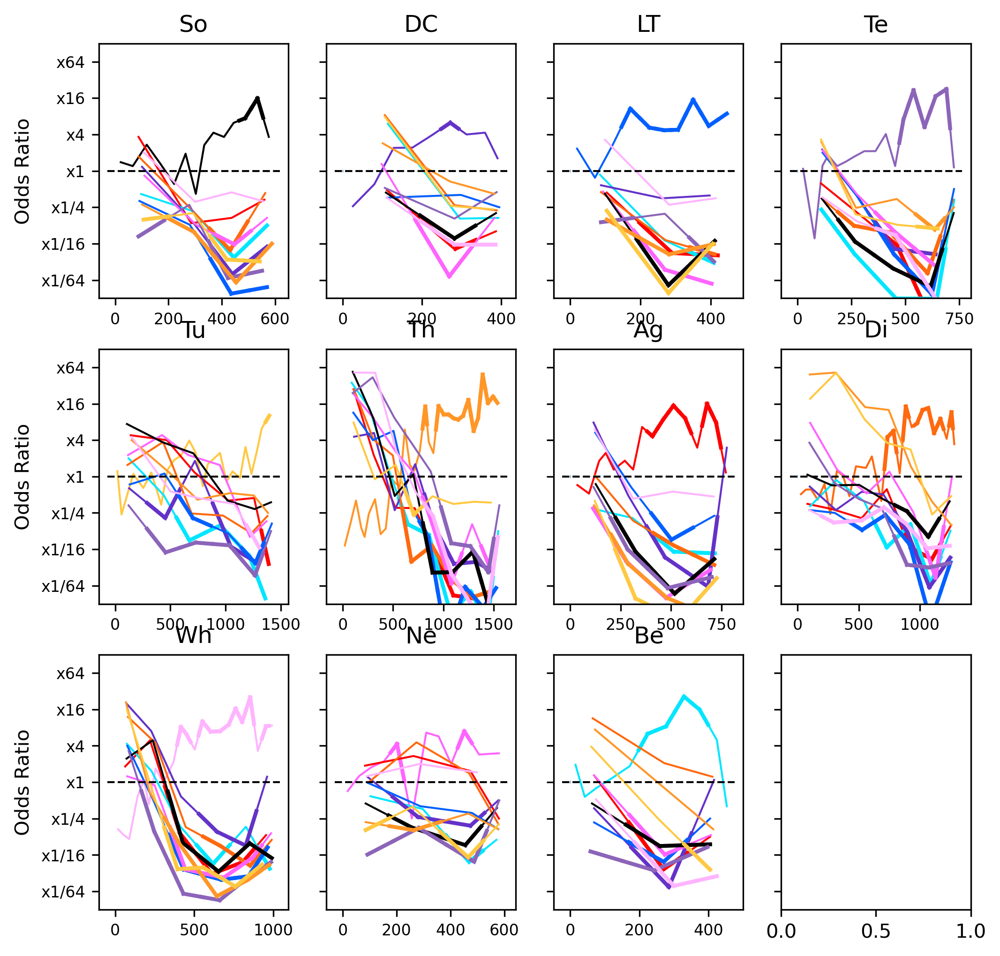

----------------------------- HpiGra1242F --------------------------------


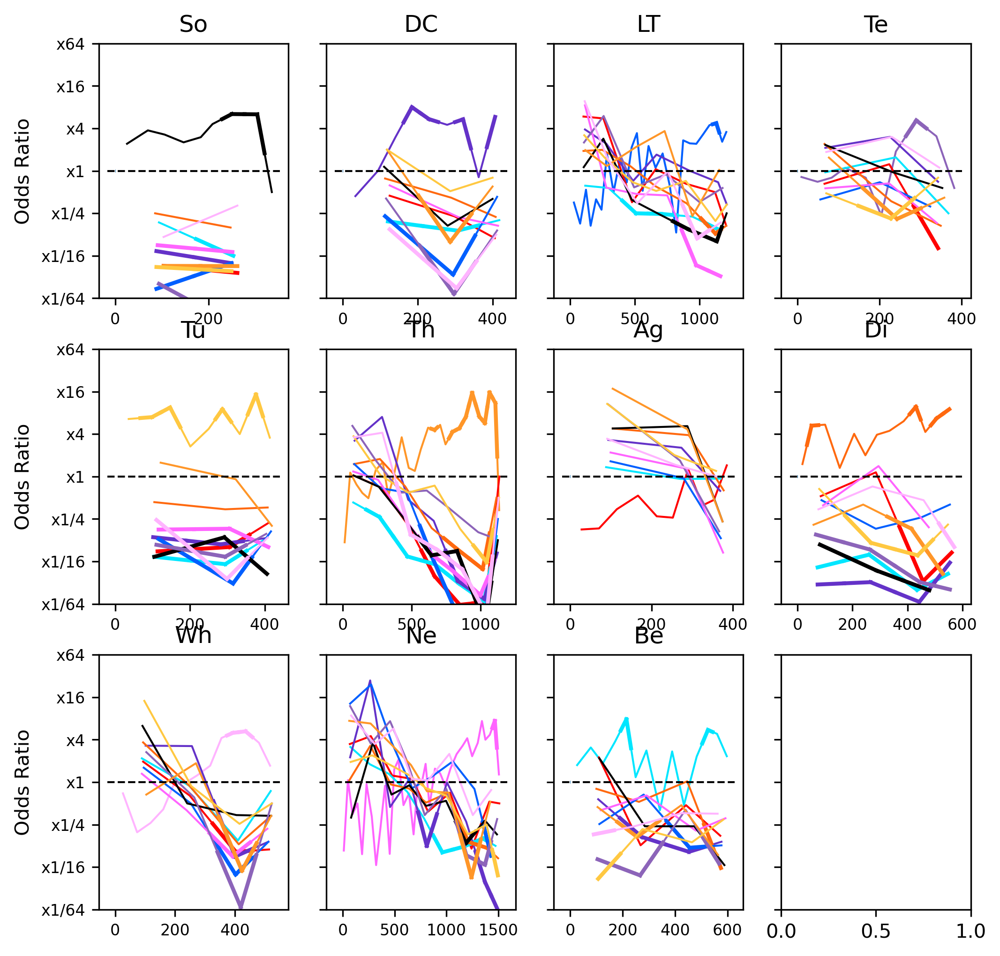

----------------------------- GreLbl3131M --------------------------------


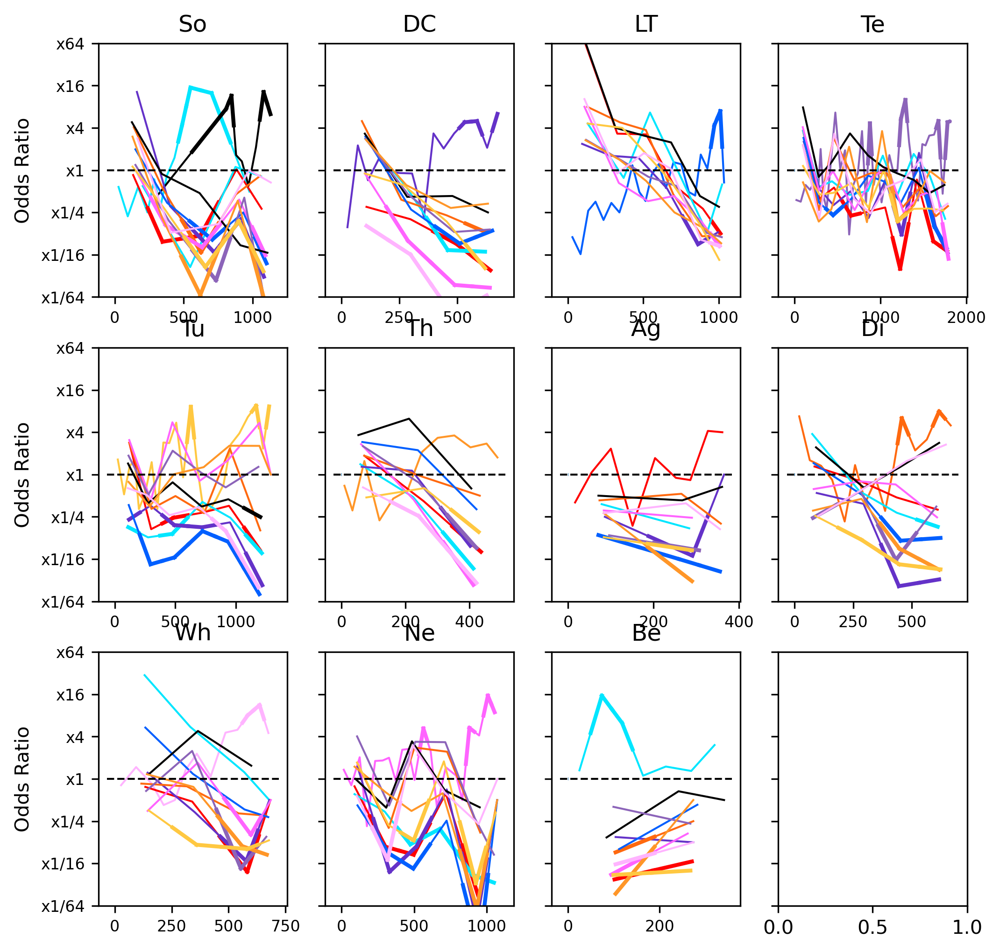

----------------------------- GreLbl1635F --------------------------------


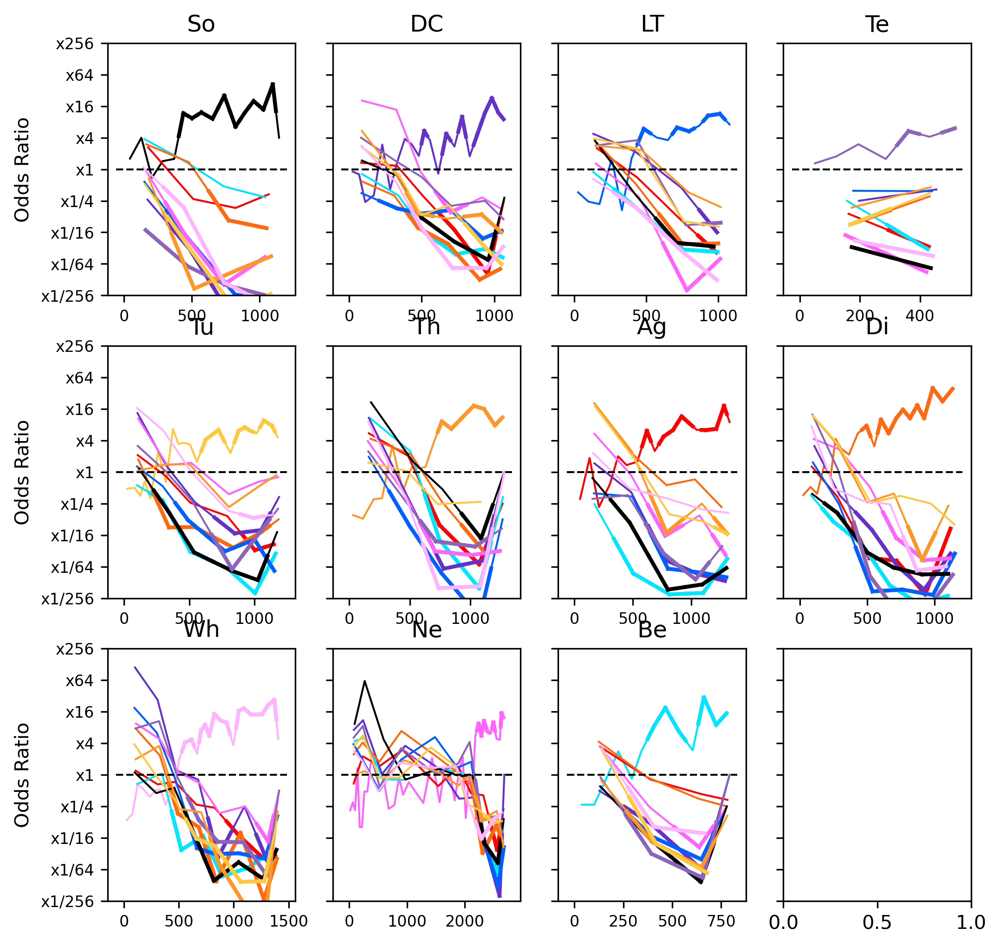

----------------------------- GraLbl4833M --------------------------------


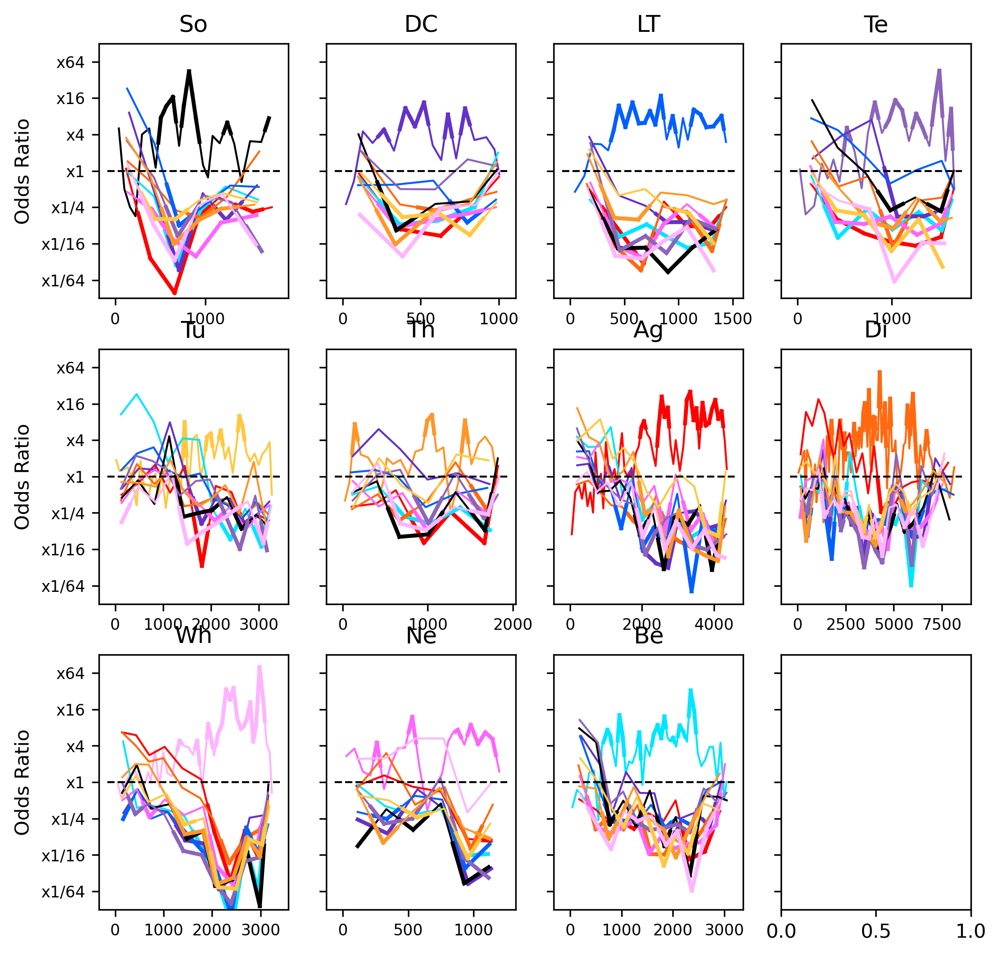

----------------------------- GraLbl1718F --------------------------------


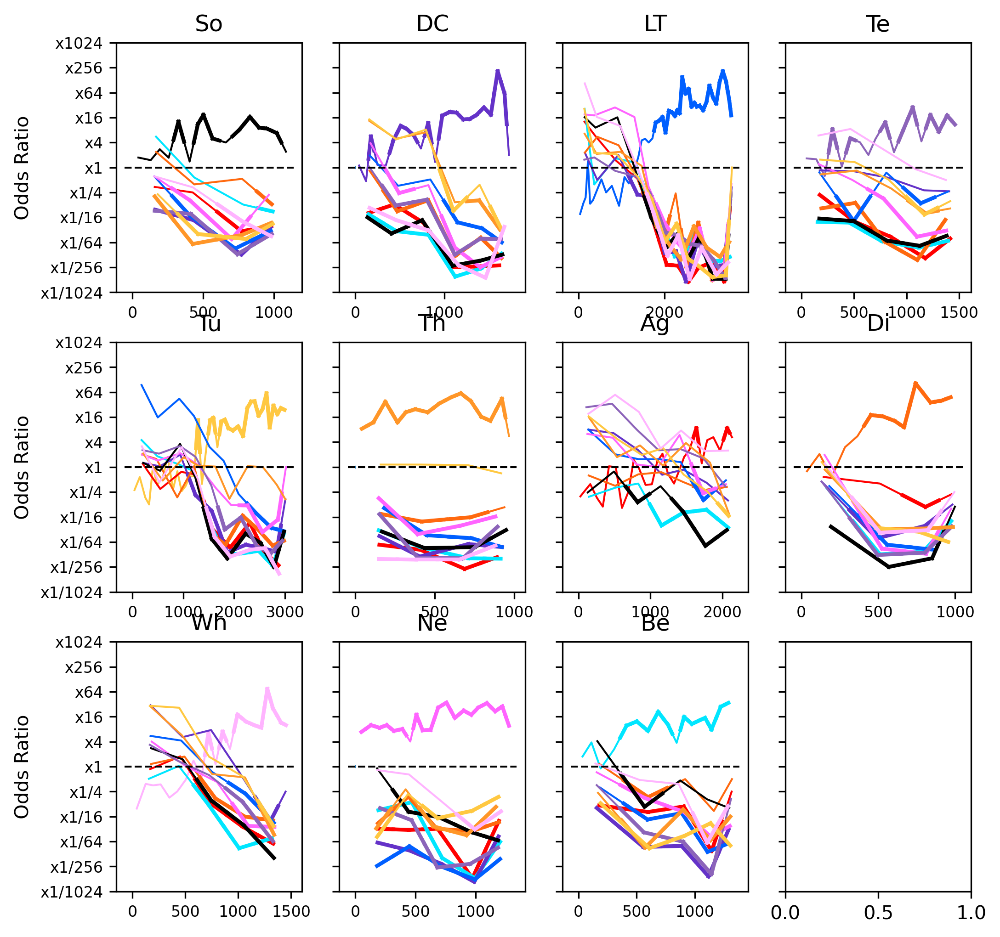

----------------------------- GraGre0917M --------------------------------


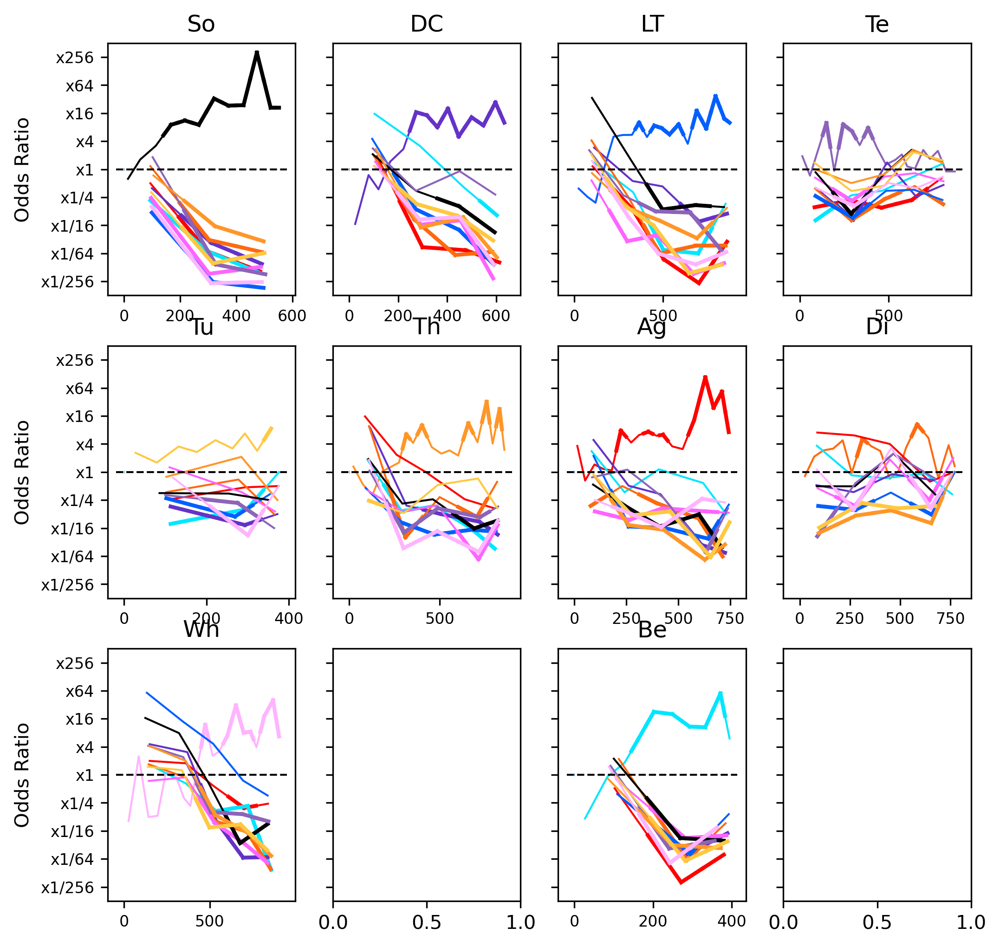

----------------------------- GraGra1918F --------------------------------


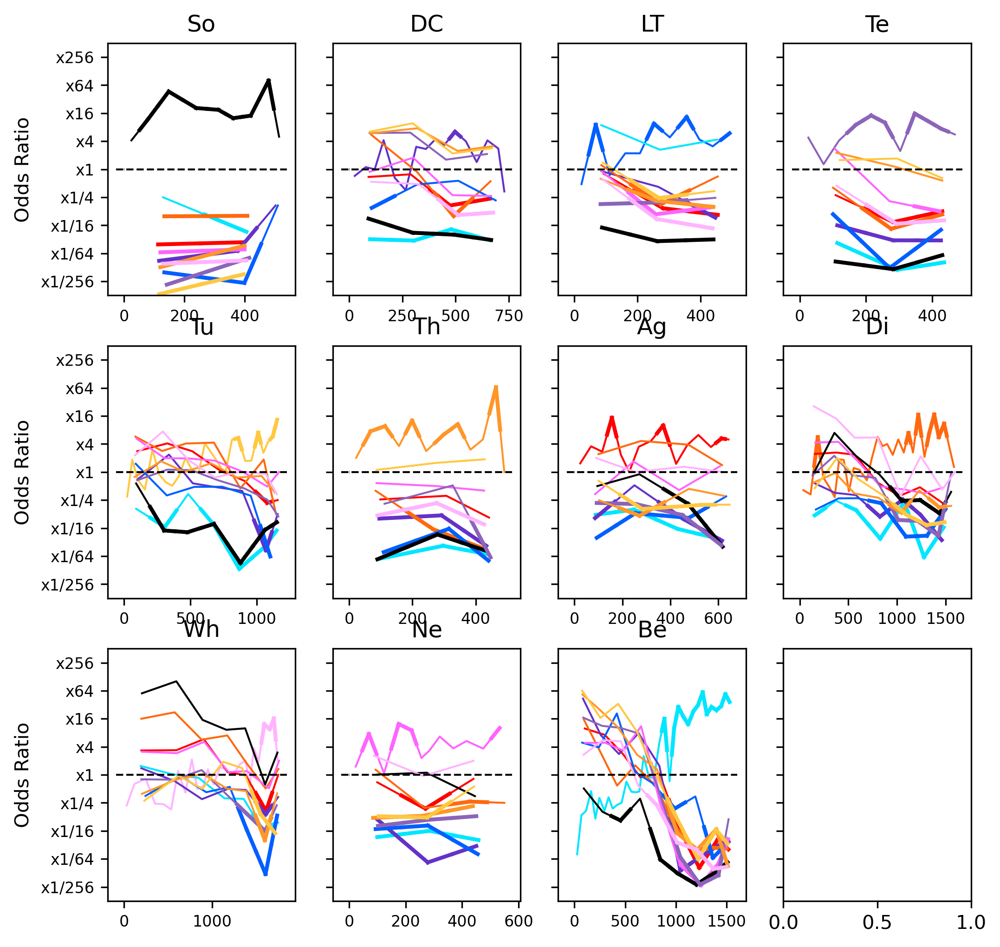

----------------------------- LblWhi1566M --------------------------------


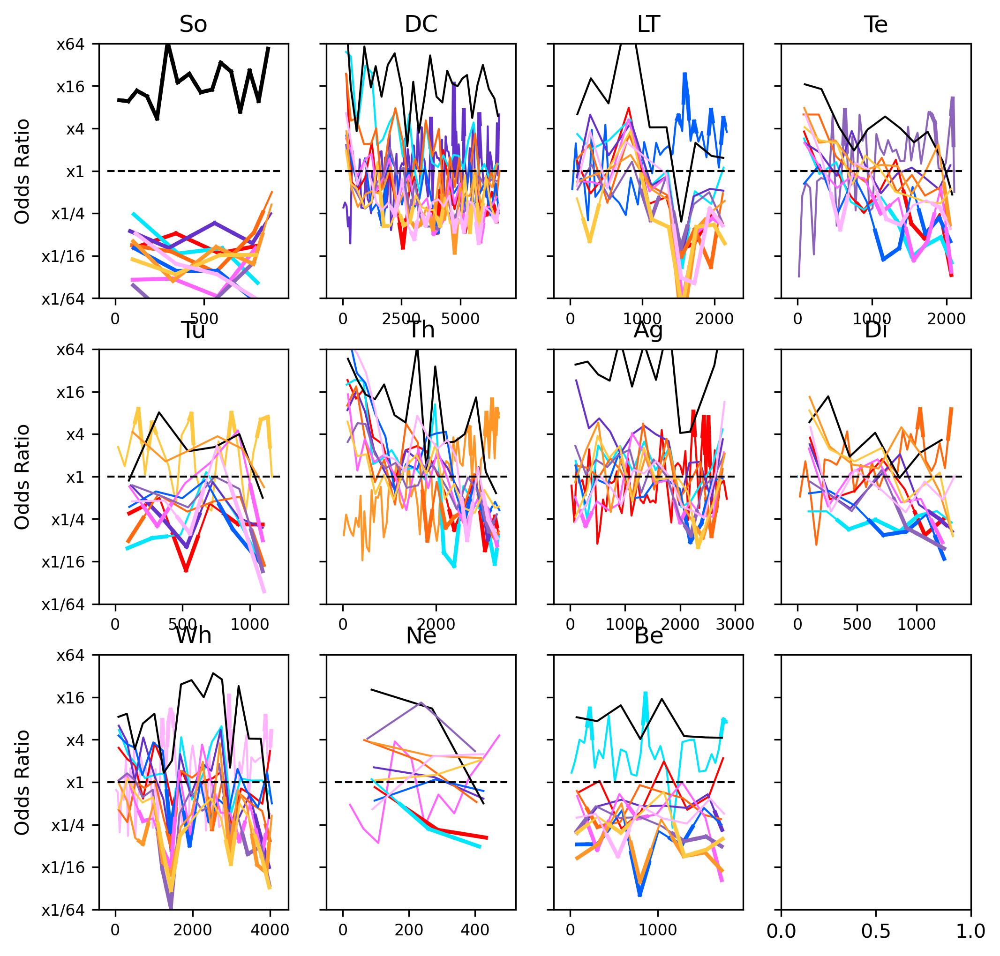

----------------------------- LblGra3039M --------------------------------


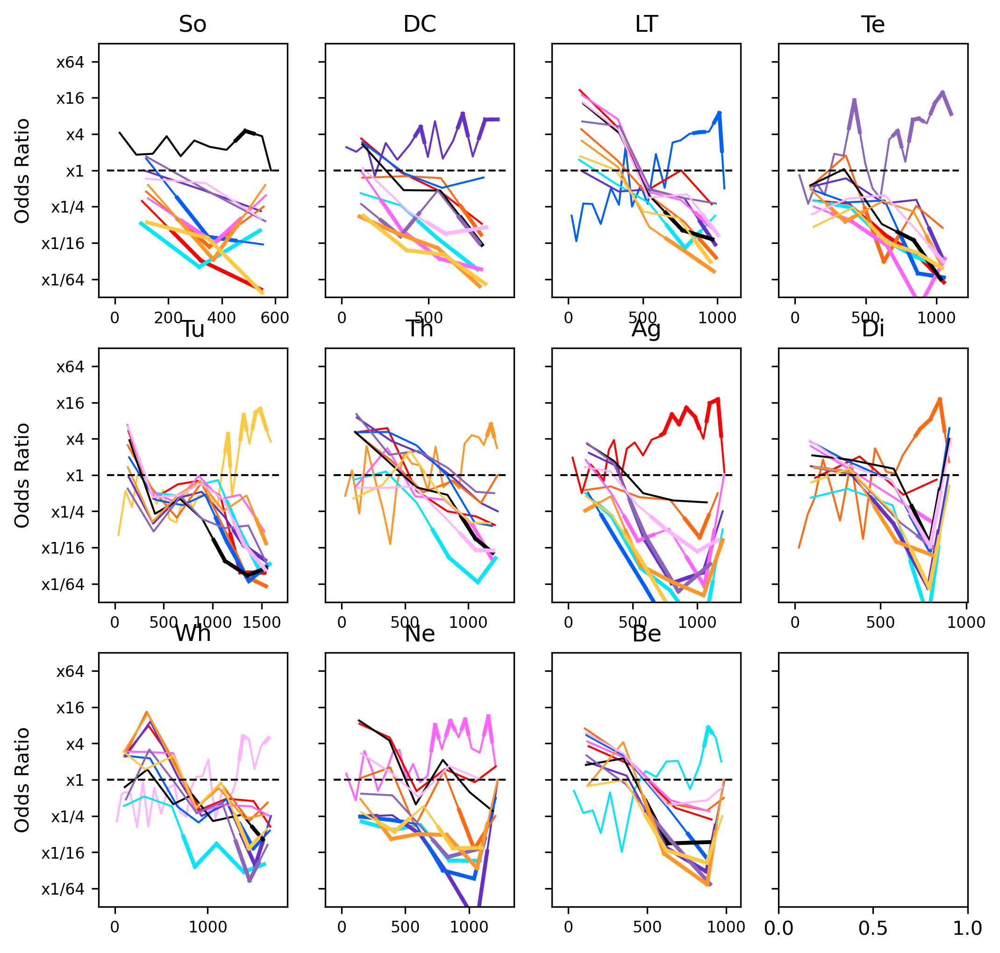

----------------------------- LblGra2826F --------------------------------


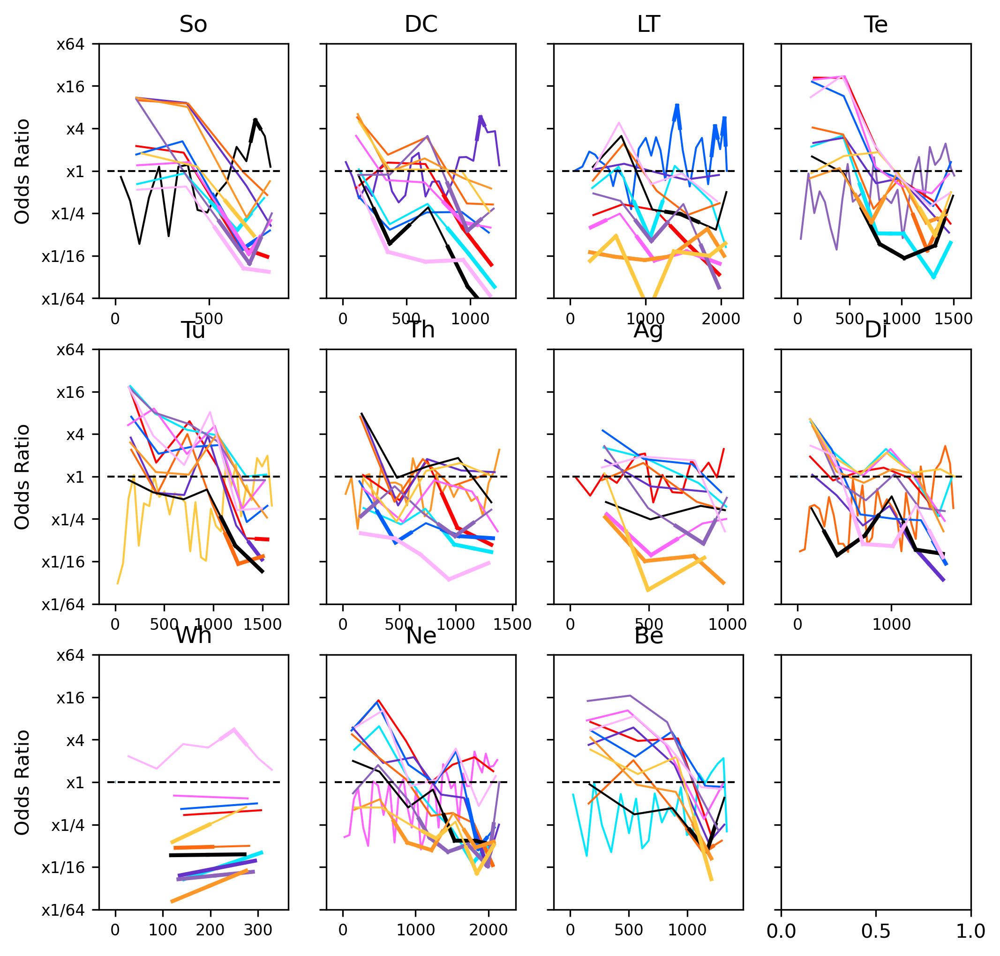

In [11]:
# pick a CT here and look at oddsratio plot for each bird with each CT
callList = [ "So", "DC", "LT", "Te", "Tu", "Th", 'Ag', 'Di', "Wh", "Ne", "Be"]
minRT = 500
for bird in bird_dates:

    print('-----------------------------', bird, '--------------------------------' )
             
    fig = plt.figure(figsize=(8,8), dpi=300)
    axList = fig.subplots(nrows=3, ncols=4, sharex=False, sharey=True, squeeze=True)
             
    for i, ct in enumerate(callList):
        #t = "%s %s"%(ct, bird)
        if (i % 4):
            ylabelOn = False
        else:
            ylabelOn = True

        if ( ct in bird_dates[bird]):
            ax = get_oddsratio(bird_dates[bird][ct]['start'],bird_dates[bird][ct]['end'],bird,"windowedoddsratios",[],[],10,plt_title=ct, ax = axList.flatten()[i], ylabelOn=ylabelOn, call_type = ct, minRT = minRT)
 
    fig.savefig(figDir + bird +'_CallTypeLC.eps')
    plt.show()


In [12]:
def count_interruption(bird, ct, minRT = 0):
    start_times = bird_dates[bird]

    # Use the very last day
    # date_start = start_times[ct]['start']

    date_end = start_times[ct]['end']
    if type(date_end) is tuple:
        date = date_end[-1]
    else:
        date = date_end

    blocks, stim_blocks = cached_load(bird, date, date, minRT = minRT)
    
    # Returning pecking date for each group
    callList2 = [ "SO", "DC", "LT", "TE", "TU", "TH", 'AG', 'DI', "WH", "NE", "BE"]
    
    # Start by filling with zeros for default values if data is missing
    results = {}
    for call_type in callList2:
        results[call_type] = [0, 0, 0]

    # Now fill in with actual data - expecting a single block
    if len(blocks) != 1:
        print('Error: more than 1 block in count interruption but 1 expected')
        
    for block, stims in zip(blocks, stim_blocks):
        block.data.index = pd.Series(np.arange(len(block.data)))
        grouped = block.data.groupby(["Call Type"])

        for call_type, igroup in grouped.groups.items():
            group = block.data.iloc[igroup]
            result = [len(group[group["Response"] == True]), len(group[group["Response"] == False]), len(group)]
            results[call_type] =  result

        
    return results

In [13]:
def results_to_confusion(results, mode='logOdds'):
    callList = [ "So", "DC", "LT", "Te", "Tu", "Th", 'Ag', 'Di', "Wh", "Ne", "Be"]
    callList2 = [ "SO", "DC", "LT", "TE", "TU", "TH", 'AG', 'DI', "WH", "NE", "BE"]
    nc = len(callList)
    confMat = np.zeros((nc,nc))
    
    if mode == 'logOdds':
        for i1, ct1 in enumerate(callList):
            for i2, ct2 in enumerate(callList2):
                if results[ct1][ct2][2] == 0 :
                    print('Warning: no data for', ct1,'-', ct2)
                    confMat[i1, i2] = -np.inf 
                else:
                    nInt = results[ct1][ct2][0]
                    nWait = results[ct1][ct2][1]
                    if nInt == 0:
                        nInt += 0.5
                        nWait -= 0.5
                    if nWait == 0:
                        nInt -= 0.5
                        nWait += 0.5
                    if i1 == i2:
                        confMat[i1, i2] = np.log2(nInt/nWait)
                    else:
                        confMat[i1, i2] = np.log2(nInt/nWait)
    elif mode == 'logOR':        
        for i1, ct1 in enumerate(callList):
            ct2 = callList2[i1]
            if results[ct1][ct2][2] == 0:
                print('Warning: no data for', ct1,'-', ct2)
                confMat[i1, i1] = -np.inf
            else:
                nInt = results[ct1][ct2][0]
                nWait = results[ct1][ct2][1]
                if nInt == 0:
                    nInt += 0.5
                    nWait -= 0.5
                if nWait == 0:
                    nInt -= 0.5
                    nWait += 0.5
                ReOdds = nInt/nWait
                
                # First the diagonal for the rewarded Odds
                NoReInt = 0
                NoReWait = 0
                for i2, ct2 in enumerate(callList2):
                    if i1 == i2:
                        continue
                    NoReInt += results[ct1][ct2][0]
                    NoReWait += results[ct1][ct2][1]
                if NoReInt == 0:
                    NoReInt += 0.5
                    NoReWait -= 0.5
                if NoReWait == 0:
                    NoReInt -= 0.5
                    NoReWait += 0.5
                
                confMat[i1, i1] = np.log2((NoReInt/NoReWait)/ReOdds)
                
            for i2, ct2 in enumerate(callList2):
                if i1 == i2:
                    continue
                if (results[ct1][ct2][2] == 0):
                    print('Warning: no data for', ct1,'-', ct2)
                    confMat[i1, i2] = -np.inf 
                    continue
                        
                NoReInt = results[ct1][ct2][0]
                NoReWait = results[ct1][ct2][1]
                if NoReInt == 0:
                    NoReInt += 0.5
                    NoReWait -= 0.5
                if NoReWait == 0:
                    NoReInt -= 0.5
                    NoReWait += 0.5
                confMat[i1, i2] = -np.log2((NoReInt/NoReWait)/ReOdds)           
        
                
    return confMat

Needs to load data
Loading 2017-04-24 ../data/behavior/HpiHpi1625F
Needs to load data
Loading 2017-04-28 ../data/behavior/HpiHpi1625F
Needs to load data
Loading 2017-04-07 ../data/behavior/HpiHpi1625F
Needs to load data
Loading 2017-04-09 ../data/behavior/HpiHpi1625F
Needs to load data
Loading 2017-04-16 ../data/behavior/HpiHpi1625F
Needs to load data
Loading 2017-04-18 ../data/behavior/HpiHpi1625F
Needs to load data
Loading 2017-04-12 ../data/behavior/HpiHpi1625F
Needs to load data
Loading 2017-04-20 ../data/behavior/HpiHpi1625F
Needs to load data
Loading 2017-04-26 ../data/behavior/HpiHpi1625F


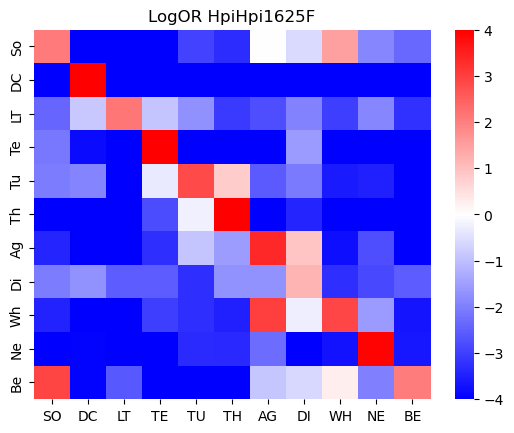

Needs to load data
Loading 2017-03-01 ../data/behavior/HpiHpi1918M
Needs to load data
Loading 2017-02-27 ../data/behavior/HpiHpi1918M
Needs to load data
Loading 2017-02-13 ../data/behavior/HpiHpi1918M
Needs to load data
Loading 2017-02-15 ../data/behavior/HpiHpi1918M
Needs to load data
Loading 2017-02-21 ../data/behavior/HpiHpi1918M


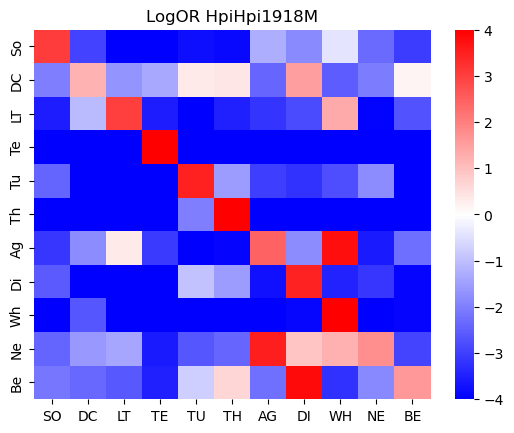

Needs to load data
Loading 2016-11-12 ../data/behavior/HpiGra1242F
Needs to load data
Loading 2016-12-12 ../data/behavior/HpiGra1242F
Needs to load data
Loading 2016-12-06 ../data/behavior/HpiGra1242F
Needs to load data
Loading 2016-12-09 ../data/behavior/HpiGra1242F
Needs to load data
Loading 2016-12-03 ../data/behavior/HpiGra1242F
Needs to load data
Loading 2016-12-16 ../data/behavior/HpiGra1242F
Needs to load data
Loading 2016-11-14 ../data/behavior/HpiGra1242F


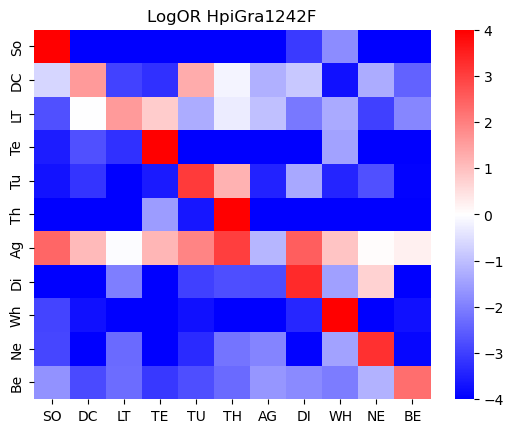

Needs to load data
Loading 2016-12-16 ../data/behavior/GreLbl3131M
Needs to load data
Loading 2017-01-27 ../data/behavior/GreLbl3131M
Needs to load data
Loading 2017-01-10 ../data/behavior/GreLbl3131M
Needs to load data
Loading 2016-12-21 ../data/behavior/GreLbl3131M
Needs to load data
Loading 2016-12-25 ../data/behavior/GreLbl3131M
Needs to load data
Loading 2017-01-23 ../data/behavior/GreLbl3131M
Needs to load data
Loading 2017-01-06 ../data/behavior/GreLbl3131M
Needs to load data
Loading 2016-12-15 ../data/behavior/GreLbl3131M
Needs to load data
Loading 2016-12-23 ../data/behavior/GreLbl3131M


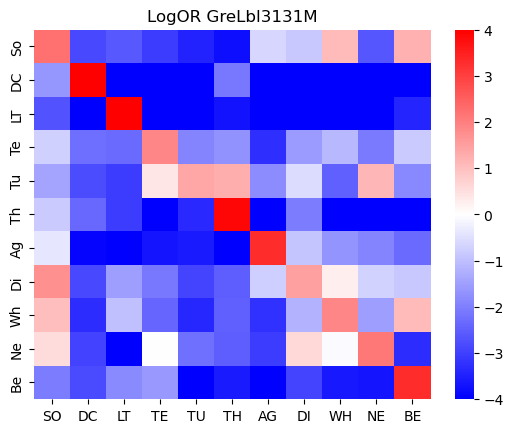

Needs to load data
Loading 2017-05-11 ../data/behavior/GreLbl1635F
Needs to load data
Loading 2017-05-23 ../data/behavior/GreLbl1635F
Needs to load data
Loading 2017-05-15 ../data/behavior/GreLbl1635F
Needs to load data
Loading 2017-05-17 ../data/behavior/GreLbl1635F
Needs to load data
Loading 2017-05-13 ../data/behavior/GreLbl1635F
Needs to load data
Loading 2017-05-09 ../data/behavior/GreLbl1635F


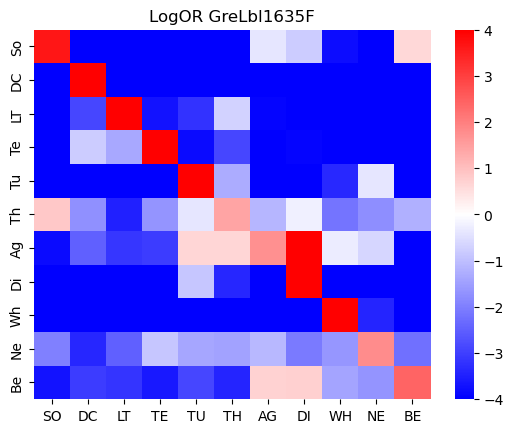

Needs to load data
Loading 2017-04-13 ../data/behavior/GraLbl4833M
Needs to load data
Loading 2017-04-16 ../data/behavior/GraLbl4833M
Needs to load data
Loading 2017-04-18 ../data/behavior/GraLbl4833M
Needs to load data
Loading 2017-04-20 ../data/behavior/GraLbl4833M
Needs to load data
Loading 2017-04-11 ../data/behavior/GraLbl4833M


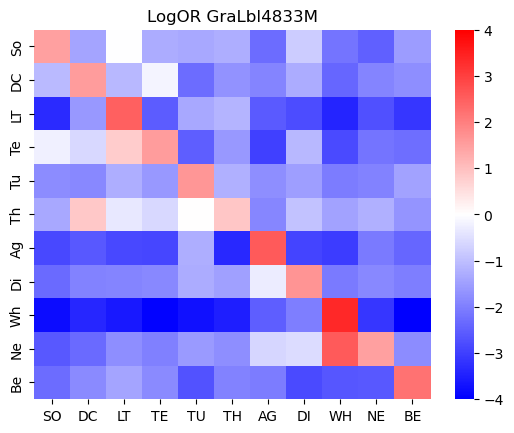

Needs to load data
Loading 2017-04-03 ../data/behavior/GraLbl1718F
Needs to load data
Loading 2017-04-05 ../data/behavior/GraLbl1718F
Needs to load data
Loading 2017-04-11 ../data/behavior/GraLbl1718F


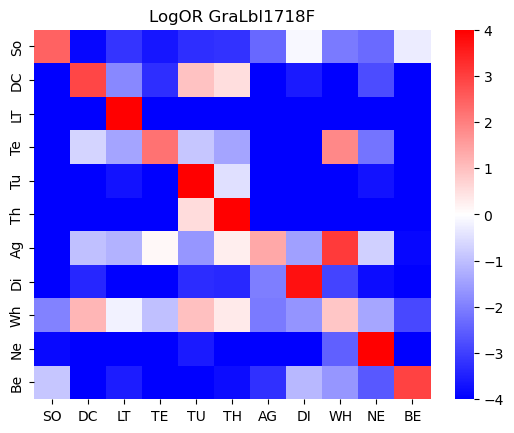

Needs to load data
Loading 2017-04-04 ../data/behavior/GraGre0917M


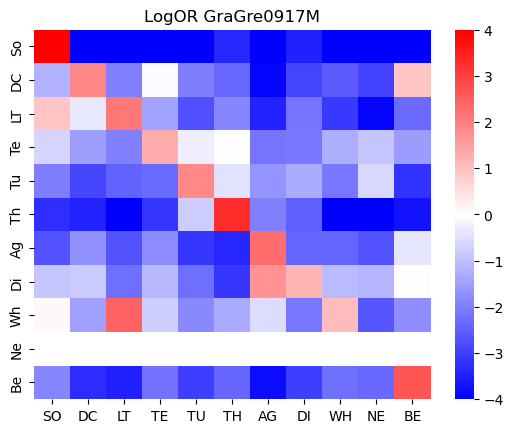

Needs to load data
Loading 2017-02-08 ../data/behavior/GraGra1918F
Needs to load data
Loading 2017-02-04 ../data/behavior/GraGra1918F
Needs to load data
Loading 2017-02-01 ../data/behavior/GraGra1918F
Needs to load data
Loading 2017-02-13 ../data/behavior/GraGra1918F


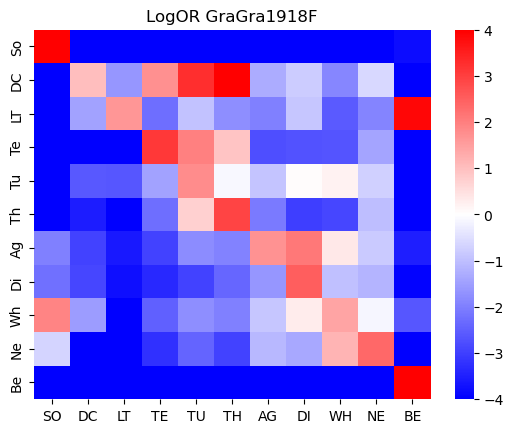

Needs to load data
Loading 2017-05-02 ../data/behavior/LblWhi1566M
Needs to load data
Loading 2017-05-08 ../data/behavior/LblWhi1566M
Needs to load data
Loading 2017-05-19 ../data/behavior/LblWhi1566M
Needs to load data
Loading 2017-05-13 ../data/behavior/LblWhi1566M
Needs to load data
Loading 2017-05-04 ../data/behavior/LblWhi1566M
Needs to load data
Loading 2017-05-16 ../data/behavior/LblWhi1566M
Needs to load data
Loading 2017-05-11 ../data/behavior/LblWhi1566M


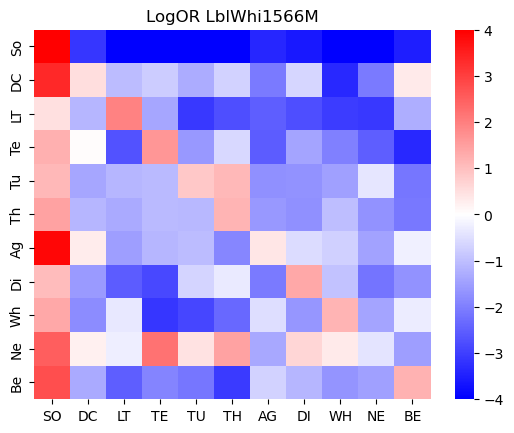

Needs to load data
Loading 2017-03-07 ../data/behavior/LblGra3039M
Needs to load data
Loading 2017-03-03 ../data/behavior/LblGra3039M
Needs to load data
Loading 2017-02-24 ../data/behavior/LblGra3039M
Needs to load data
Loading 2017-03-23 ../data/behavior/LblGra3039M
Needs to load data
Loading 2017-03-10 ../data/behavior/LblGra3039M
Needs to load data
Loading 2017-02-27 ../data/behavior/LblGra3039M
Needs to load data
Loading 2017-03-05 ../data/behavior/LblGra3039M
Needs to load data
Loading 2017-03-13 ../data/behavior/LblGra3039M
Needs to load data
Loading 2017-03-01 ../data/behavior/LblGra3039M
Needs to load data
Loading 2017-03-16 ../data/behavior/LblGra3039M


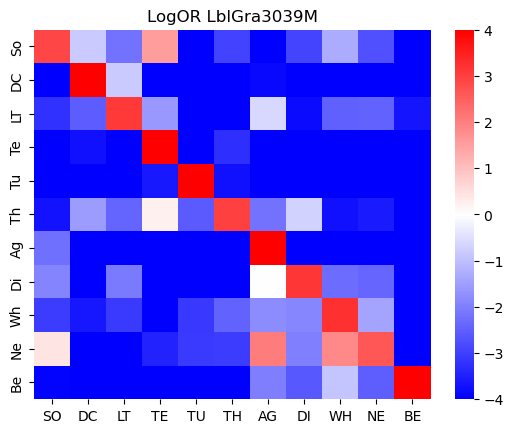

Needs to load data
Loading 2016-11-15 ../data/behavior/LblGra2826F
Needs to load data
Loading 2016-11-13 ../data/behavior/LblGra2826F
Needs to load data
Loading 2016-10-23 ../data/behavior/LblGra2826F
Needs to load data
Loading 2016-11-01 ../data/behavior/LblGra2826F
Needs to load data
Loading 2016-11-06 ../data/behavior/LblGra2826F
Needs to load data
Loading 2016-11-17 ../data/behavior/LblGra2826F
Needs to load data
Loading 2016-10-25 ../data/behavior/LblGra2826F
Needs to load data
Loading 2016-11-10 ../data/behavior/LblGra2826F
Needs to load data
Loading 2016-10-28 ../data/behavior/LblGra2826F
Needs to load data
Loading 2016-11-03 ../data/behavior/LblGra2826F


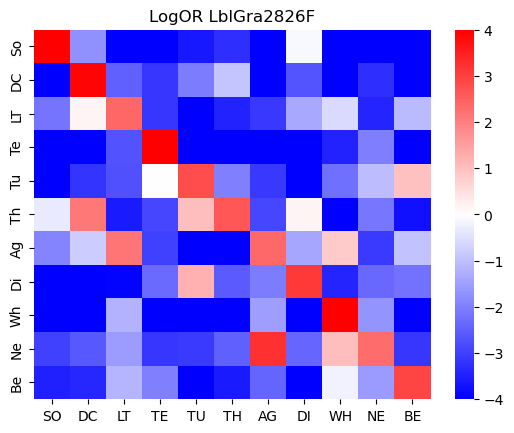

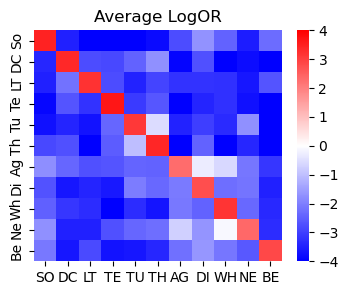

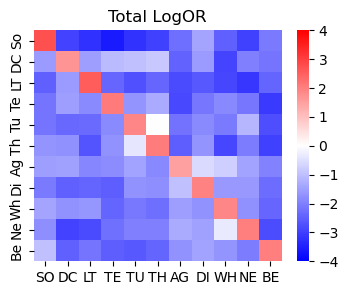

In [14]:
# The minimum response time
minRT = 500

# Lower case for rewarded stimulus, upper case for unrewarded
callList = [ "So", "DC", "LT", "Te", "Tu", "Th", 'Ag', 'Di', "Wh", "Ne", "Be"]
callList2 = [ "SO", "DC", "LT", "TE", "TU", "TH", 'AG', 'DI', "WH", "NE", "BE"]

nc = len(callList)
nbirds = len(bird_dates)
nbirdsAvg = 0
confMatAvg = np.zeros((nc,nc))
cmap = plt.colormaps['bwr']

oddRatios = {'Bird': [], 'Call': [], 'OR': []}


# Make a dict for overall results
resultsTot = {}
resultsBird = {'Bird' : [], 'Results': []}

for ct in callList:
    resultsTot[ct] = {}
    for ct2 in callList2: 
        resultsTot[ct][ct2] = np.array([0, 0, 0])

for bird in bird_dates:
    results = {}
    for ct in callList:
        if ct in bird_dates[bird]:
            results[ct] = count_interruption(bird, ct, minRT = minRT)
        else:
            results[ct] = {}
            for ct2 in callList2: 
                results[ct][ct2] = [0, 0, 0]
    resultsBird['Bird'].append(bird)
    resultsBird['Results'].append(results)
    
    # Addup all the data
    for ct in callList:
        for ct2 in callList2: 
            resultsTot[ct][ct2] += np.array(results[ct][ct2])

    confMat = results_to_confusion(results, mode='logOR')
    if (-np.inf not in confMat):
        confMatAvg = confMatAvg + confMat
        nbirdsAvg += 1

    confMatdf = pd.DataFrame(confMat, index=callList,columns=callList2)
    
    for ic, ct in enumerate(callList):
        oddRatios['Bird'].append(bird)
        oddRatios['Call'].append(ct)
        if confMat[ic, ic] != -np.inf :
            oddRatios['OR'].append(np.power(2,confMat[ic,ic]))
        else:
            oddRatios['OR'].append(None)
    

    plt.figure()
    sns.heatmap(confMatdf, vmin = -4, vmax = 4, center = 0, mask = (confMatdf == -np.inf), cmap = cmap)
    plt.title('LogOR ' + bird)
    plt.savefig(figDir + bird + '_ConfMat.eps')
    plt.show()
    

dfOddRatios = pd.DataFrame(oddRatios)

# Average per bird for birds that have all the data
confMatAvg /= nbirdsAvg
confMatAvgdf = pd.DataFrame(confMatAvg, index=callList,columns=callList2)
plt.figure(figsize= (4,3), dpi=100)
sns.heatmap(confMatAvgdf, vmin = -4, vmax = 4, annot=False, fmt=".1f", center = 0, cmap = cmap)
plt.title('Average LogOR')
plt.savefig(figDir + '/Average_ConfMat.eps')
plt.show()

# Average obtained by summing
confMatTot = results_to_confusion(resultsTot, mode='logOR')
confMatTotdf = pd.DataFrame(confMatTot, index=callList,columns=callList2)
plt.figure(figsize= (4,3), dpi=100)
sns.heatmap(confMatTotdf, vmin = -4, vmax = 4, annot=False, fmt=".1f", center = 0, cmap=cmap)
plt.title('Total LogOR')
plt.savefig(figDir + 'Total_ConfMat.eps')
plt.show()



In [15]:
iMale = []
iFemale = []

for i in dfOddRatios.index:
    if dfOddRatios['Bird'][i][-1] == 'M':
        iMale.append(i)
    else:
        iFemale.append(i)

dfOddRatios['Sex'] = 'F'
dfOddRatios['Sex'].iloc[iMale] = 'M'

In [16]:
dfOddRatios.loc[(dfOddRatios['Call'] == 'Di')]

,Bird,Call,OR,Sex
7,HpiHpi1625F,Di,2.230769,F
18,HpiHpi1918M,Di,11.054233,M
29,HpiGra1242F,Di,10.112069,F
40,GreLbl3131M,Di,2.811798,M
51,GreLbl1635F,Di,38.324468,F
62,GraLbl4833M,Di,3.203060,M
73,GraLbl1718F,Di,13.338462,F
84,GraGre0917M,Di,2.254837,M
95,GraGra1918F,Di,5.704365,F
106,LblWhi1566M,Di,2.590038,M


[3.125e-02 1.250e-01 5.000e-01 2.000e+00 8.000e+00 3.200e+01 1.280e+02
 5.120e+02 2.048e+03]


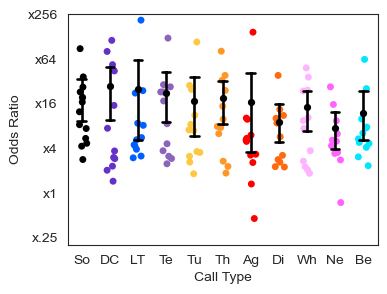

In [17]:
# Performance along the diagonal

f = plt.figure(figsize=(4,3), dpi = 100)
sns.set_style(style='white')

ax = plt.gca()
sns.stripplot(jitter=.2, x="Call", y="OR", palette = [callColor[c] for c in callList],size=5, data=dfOddRatios, order = callList,zorder=1, ax = ax)
sns.pointplot(x="Call", y="OR", data=dfOddRatios, join=False, order = callList, ax=ax,color='black',markers='o',capsize=.3, scale = 0.7)
ax.set_ylim((0.2, 260))
ax.set_yscale("log",base=2)

print(ax.get_yticks())
#ax.set_yticks([.5,1,4,8,16,64,128])
ax.set_yticks([.25,1,4,16,64,256])
ax.set_yticklabels(['x.25'] + ['x%d'%x for x in ax.get_yticks()[1:]])
#ax.set_yticklabels(['x.25','x1','x4','x16','x64','x128'])
plt.ylabel("Odds Ratio")
plt.xlabel("Call Type")
plt.savefig('/Users/frederictheunissen/Desktop/OddsRatioPerCallType.eps')

In [22]:
result

{'So': {'SO': [0, 39, 39],
  'DC': [1, 23, 24],
  'LT': [6, 13, 19],
  'TE': [9, 15, 24],
  'TU': [3, 19, 22],
  'TH': [3, 24, 27],
  'AG': [10, 24, 34],
  'DI': [0, 36, 36],
  'WH': [17, 15, 32],
  'NE': [7, 17, 24],
  'BE': [8, 29, 37]},
 'DC': {'SO': [21, 8, 29],
  'DC': [1, 32, 33],
  'LT': [4, 23, 27],
  'TE': [5, 18, 23],
  'TU': [4, 31, 35],
  'TH': [1, 17, 18],
  'AG': [11, 16, 27],
  'DI': [5, 25, 30],
  'WH': [19, 11, 30],
  'NE': [6, 20, 26],
  'BE': [8, 9, 17]},
 'LT': {'SO': [19, 32, 51],
  'DC': [5, 43, 48],
  'LT': [6, 46, 52],
  'TE': [24, 21, 45],
  'TU': [37, 18, 55],
  'TH': [30, 21, 51],
  'AG': [26, 23, 49],
  'DI': [12, 36, 48],
  'WH': [8, 41, 49],
  'NE': [28, 20, 48],
  'BE': [11, 40, 51]},
 'Te': {'SO': [18, 25, 43],
  'DC': [7, 36, 43],
  'LT': [3, 41, 44],
  'TE': [0, 45, 45],
  'TU': [6, 32, 38],
  'TH': [7, 32, 39],
  'AG': [7, 36, 43],
  'DI': [13, 35, 48],
  'WH': [5, 41, 46],
  'NE': [2, 44, 46],
  'BE': [20, 19, 39]},
 'Tu': {'SO': [16, 21, 37],
  'DC'

In [28]:
# Make a new data frame to perform Fisher exact tests and other generalized mixed effect models for binomial
sigBirds = {"So": 0, "DC": 0, "LT": 0, "Te": 0, "Tu": 0, "Th": 0, 'Ag': 0, 'Di': 0, "Wh": 0, "Ne": 0, "Be": 0}
totBirds = {"So": 0, "DC": 0, "LT": 0, "Te": 0, "Tu": 0, "Th": 0, 'Ag': 0, 'Di': 0, "Wh": 0, "Ne": 0, "Be": 0}


resultsBirdR = {'Bird': [], 'Sex': [], 'Call': [], 'Re' : [], 'Int': [], 'NoInt' : []}
fisherP = {'Bird': [], 'Sex': [], 'Call': [], 'p': []}

for ibird, bird in enumerate(resultsBird['Bird']):
    if bird[-1] == 'M':
        sex = 'M'
    elif bird[-1] == 'F':
        sex = 'F'
    else:
        sex = 'U'

    result = resultsBird['Results'][ibird]
    for ctRe in result.keys():
        countResults = result[ctRe]
        intNoRe = 0
        noIntNoRe = 0
        for ct in countResults.keys():
            if ctRe.upper() == ct:
                intRe = countResults[ct][0]
                noIntRe = countResults[ct][1]
            else:
                intNoRe += countResults[ct][0]
                noIntNoRe += countResults[ct][1]
        if intRe+noIntRe > 0 :
            # Store data in data frame for R like stat analyses
            resultsBirdR['Bird'].append(bird)
            resultsBirdR['Sex'].append(sex)
            resultsBirdR['Call'].append(ctRe)
            resultsBirdR['Re'].append('Y')
            resultsBirdR['Int'].append(intRe)
            resultsBirdR['NoInt'].append(noIntRe)

            resultsBirdR['Bird'].append(bird)
            resultsBirdR['Sex'].append(sex)
            resultsBirdR['Call'].append(ctRe)
            resultsBirdR['Re'].append('N')
            resultsBirdR['Int'].append(intNoRe)
            resultsBirdR['NoInt'].append(noIntNoRe)

            # Perform a fisher exact test for that bird and call type
            totBirds[ctRe] += 1   # Count the number of tests for each call-type
            fisherP['Bird'].append(bird)
            fisherP['Sex'].append(sex)
            fisherP['Call'].append(ctRe)
            res = fisher_exact([[intRe, intNoRe], [noIntRe, noIntNoRe]], alternative='less')
            fisherP['p'].append(res[1])

            #if res[1] < 0.05:
            #    sigBirds[ctRe] +=1
            #else:
            #    print('Not significant entry: Bird %s Sex %s Call type %s OR = %.2f' % (bird, sex, ctRe,
            #                    dfOddRatios.loc[(dfOddRatios['Bird'] == bird) & (dfOddRatios['Call'] == ctRe)]['OR'].values[0] ))


resultsBirdRdf = pd.DataFrame.from_dict(resultsBirdR)
fisherPdf = pd.DataFrame.from_dict(fisherP)
rejected, Fisher_adjusted_p, _, _ = multipletests(fisherPdf['p'], method='fdr_bh')
fisherPdf['p_adj'] = Fisher_adjusted_p

for row in fisherPdf.itertuples(index=False):
    ctRe = row.Call
    if (row.p_adj < 0.05):
        sigBirds[ctRe] +=1
    else:
         print('Not significant entry: Bird %s Sex %s Call type %s OR = %.2f' % (row.Bird, row.Sex, ctRe,
                                dfOddRatios.loc[(dfOddRatios['Bird'] == row.Bird) & (dfOddRatios['Call'] == ctRe)]['OR'].values[0] ))


# Printing the Fisher Exact Test resuls
for ct in totBirds.keys():
    print('%s : Sig = %d/%d' % (ct, sigBirds[ct], totBirds[ct]))


# Write to csv for R code analyses.

resultsBirdRdf.to_csv(RESULTSDIR+'resultsBirdR.csv', index=True, header=True)
    


Not significant entry: Bird HpiHpi1625F Sex F Call type Di OR = 2.23
Not significant entry: Bird HpiGra1242F Sex F Call type Ag OR = 0.45
Not significant entry: Bird LblWhi1566M Sex M Call type Ag OR = 1.32
Not significant entry: Bird LblWhi1566M Sex M Call type Ne OR = 0.74
So : Sig = 12/12
DC : Sig = 12/12
LT : Sig = 12/12
Te : Sig = 12/12
Tu : Sig = 12/12
Th : Sig = 12/12
Ag : Sig = 10/12
Di : Sig = 11/12
Wh : Sig = 12/12
Ne : Sig = 10/11
Be : Sig = 12/12


In [29]:
fisherPdf

,Bird,Sex,Call,p,p_adj
0,HpiHpi1625F,F,So,8.067787e-12,2.577756e-11
1,HpiHpi1625F,F,DC,1.344054e-43,3.521421e-42
2,HpiHpi1625F,F,LT,1.016481e-07,1.987449e-07
3,HpiHpi1625F,F,Te,4.461889e-14,1.771235e-13
4,HpiHpi1625F,F,Tu,1.005235e-03,1.125520e-03
...,...,...,...,...,...
126,LblGra2826F,F,Ag,6.373924e-03,6.733743e-03
127,LblGra2826F,F,Di,4.373027e-03,4.695627e-03
128,LblGra2826F,F,Wh,7.930828e-07,1.367024e-06
129,LblGra2826F,F,Ne,2.449685e-04,2.839900e-04


[3.125e-02 1.250e-01 5.000e-01 2.000e+00 8.000e+00 3.200e+01 1.280e+02
 5.120e+02 2.048e+03]


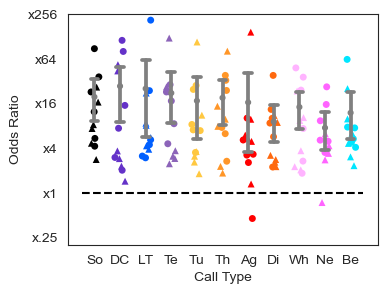

In [19]:
# Performance along the diagonal separated between males (triangles) and females (circles)

f = plt.figure(figsize=(4,3), dpi = 100)
sns.set_style(style='white')

ax = plt.gca()
sns.stripplot(jitter=.2, x="Call", y="OR", palette = [callColor[c] for c in callList],size=5, data=dfOddRatios.loc[dfOddRatios['Sex']=='M'], marker = '^', order = callList,zorder=1, ax = ax)
sns.stripplot(jitter=.2, x="Call", y="OR", palette = [callColor[c] for c in callList],size=5, data=dfOddRatios.loc[dfOddRatios['Sex']=='F'], marker = 'o', order = callList,zorder=1, ax = ax)

sns.pointplot(x="Call", y="OR", data=dfOddRatios, join=False, order = callList, ax=ax,color=[0.5, 0.5, 0.5, 0.5],markers='o',capsize=.3, scale = 0.5)

ax.set_ylim((0.2, 260))
ax.set_yscale("log",base=2)
ax.hlines(y=1, xmin=-0.50, xmax=10.5, linestyles='--', colors='k')

print(ax.get_yticks())
ax.set_yticks([.25,1,4,16,64,256])
ax.set_yticklabels(['x.25'] + ['x%d'%x for x in ax.get_yticks()[1:]])
plt.ylabel("Odds Ratio")
plt.xlabel("Call Type")
plt.savefig(figDir + 'OddsRatioPerCallType.eps')